## 命名规则
rmse:
feature_method+model

pic:
feature_method+model

In [2]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# from pylab import *
#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline

import copy

In [3]:
energy = pd.read_csv(r'./dataset/energydata_complete/energydata_complete.csv',parse_dates = ['date'],index_col = 0)
energy.replace(0, np.nan, inplace=True)
for j in range(0,energy.shape[1]):
    energy.iloc[:,j].replace(0,energy.iloc[:,j].mean(), inplace=True)

df = energy.resample('D').sum()
df['Appliances_1'] = df['Appliances'].shift(-1)
df.dropna(inplace=True)

In [4]:
df.shape

(338, 29)

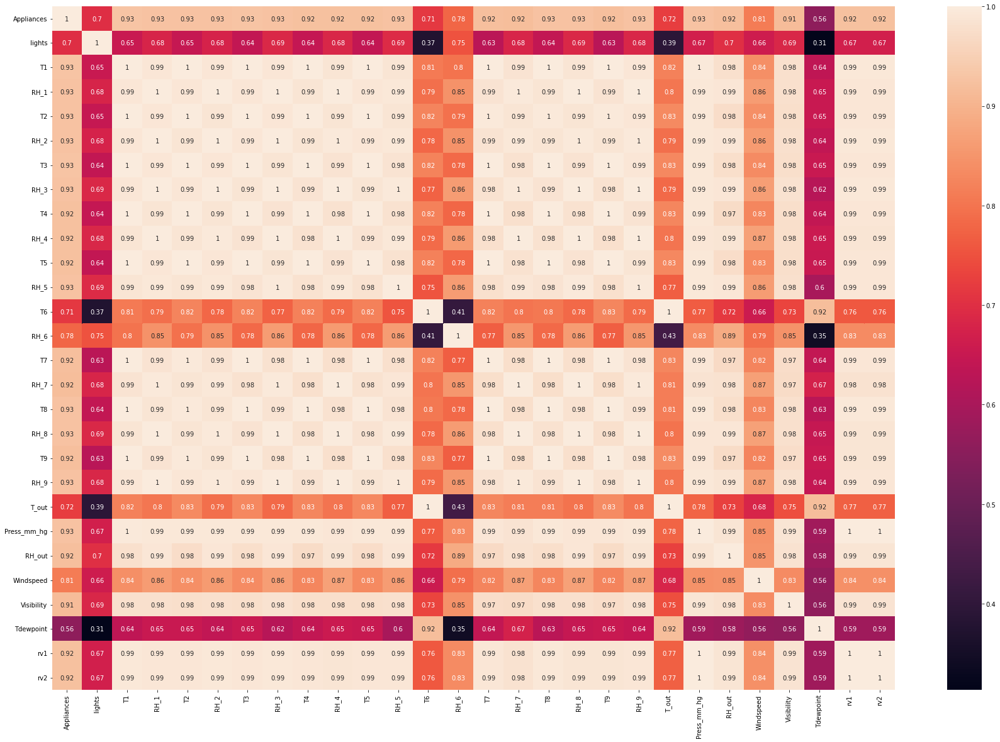

In [12]:
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(), annot=True)
plt.savefig('./pic/Correlation Pic/Energy/Corr_Energy.png')

In [5]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [6]:
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df

def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [7]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

### Lag the feature based on the order of feature in data.columns
def lag_feature_df(max_lag,data,target):
    # Store each feature's dataframe:
    X = pd.DataFrame()
    X_col = list(data.columns)
    X_col.remove(target)
    feature_range = range(len(X_col))
    for idx,col in enumerate(X_col):
        for j in range(max_lag):
            X[col+'_lag_'+str(j+1)] = data[col].shift(j)
    X[target] = data[target].copy()
    X.dropna(inplace=True)
    return X

In [8]:
df_lag = lag_feature_df(30,df,'Appliances_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)
## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'Appliances_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'Appliances_1')
X_test_lag,Y_test_lag = segment(test_lag,'Appliances_1')

train_no,valid_no,test_no = Train_Valid_Test(df.loc[df_lag.index],0.7,0.1,0.2)

## No lagging
X_train_no,Y_train_no = segment(train_no,'Appliances_1')
X_valid_no,Y_valid_no = segment(test_no,'Appliances_1')
X_test_no,Y_test_no = segment(test_no,'Appliances_1')

In [9]:
X_arr = X_train_lag.values

In [10]:
X_train_lag

,Appliances_lag_1,Appliances_lag_2,Appliances_lag_3,Appliances_lag_4,Appliances_lag_5,Appliances_lag_6,Appliances_lag_7,Appliances_lag_8,Appliances_lag_9,Appliances_lag_10,...,rv2_lag_21,rv2_lag_22,rv2_lag_23,rv2_lag_24,rv2_lag_25,rv2_lag_26,rv2_lag_27,rv2_lag_28,rv2_lag_29,rv2_lag_30
date,,,,,,,,,,,,,,,,,,,,,
2016-01-31,18640,18790.0,6920.0,5400.0,6570.0,10270.0,9470.0,21640.0,13400.0,6580.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,3412.602365,3436.322390,3522.087531,3411.478224
2016-02-01,0,18640.0,18790.0,6920.0,5400.0,6570.0,10270.0,9470.0,21640.0,13400.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,3412.602365,3436.322390,3522.087531
2016-02-02,11220,0.0,18640.0,18790.0,6920.0,5400.0,6570.0,10270.0,9470.0,21640.0,...,3378.920507,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3412.602365,3436.322390
2016-02-03,13360,11220.0,0.0,18640.0,18790.0,6920.0,5400.0,6570.0,10270.0,9470.0,...,3638.097980,3378.920507,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3412.602365
2016-02-04,7300,13360.0,11220.0,0.0,18640.0,18790.0,6920.0,5400.0,6570.0,10270.0,...,3785.690222,3638.097980,3378.920507,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-08-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,3372.278022,3934.145824,3407.080512,3415.115956,0.000000,0.000000
2016-08-30,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,3372.278022,3934.145824,3407.080512,3415.115956,0.000000
2016-08-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,3372.278022,3934.145824,3407.080512,3415.115956


In [11]:
X_train_no

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,
2016-01-31,18640,1680.0,3090.288333,6222.205000,2979.861667,6079.130000,3050.095000,6435.933333,2763.421667,6519.556667,...,2423.015000,6993.490000,1032.90,108518.60,13403.5,805.5,5185.0,880.500,3723.899044,3723.899044
2016-02-01,0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.000,0.000000,0.000000
2016-02-02,11220,2150.0,3171.826667,6764.288333,3071.214167,6520.007500,3246.901863,6593.741774,3000.917500,6856.595833,...,2618.709167,7199.085000,1195.30,109130.05,13169.0,844.5,6445.5,1002.200,3775.841029,3775.841029
2016-02-03,13360,600.0,3009.022500,5675.817500,2835.696667,5602.135833,2980.623333,5561.895000,2902.052500,5388.340000,...,2623.960000,5864.032500,854.90,107365.25,11562.0,1103.5,5366.5,376.097,3560.173366,3560.173366
2016-02-04,7300,0.0,3039.916667,5717.064167,2783.755000,6049.265833,3144.873333,5420.947500,2870.008333,5570.037500,...,2839.884167,5517.751667,1344.15,108941.05,11468.0,324.5,4857.5,848.600,3592.475873,3592.475873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-08-29,0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.000,0.000000,0.000000
2016-08-30,0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.000,0.000000,0.000000
2016-08-31,0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0,0.000,0.000000,0.000000


## Prediction Models

In [12]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [13]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [14]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [15]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [16]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [17]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [18]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

In [19]:
mi_xy = mutual_info_regression(X_train_lag,Y_train_lag)
mi_xx = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])

for i in range(mi_xx.shape[1]):
    for j in range(mi_xx.shape[1]):
        mi_xx[i][j] = mutual_info_regression(X_arr[:,i].reshape(-1,1),X_arr[:,j])
    print(i+1,'/',mi_xx.shape[1],end='\r',flush=True)

In [20]:
def mRMR(selected,idx,metric_xy,metric_xx):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(selected)
        
        for i in selected:
            redundency_score+=metric_xx[idx][i]
        redundency_score/=(col_len)
        
#         for i in X_s:
#             relevance_score+=metric_xy[i]
#         relevance_score/=(col_len)
        

#         for i in range(col_len - 1):
#             for j in range(i+1,col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

def incremental_selection(x,metric):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx = []
    # stop = False
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm   
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR(selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [21]:
mi_mi = incremental_selection(X_train_lag,'MI-MI')
len(mi_mi)

MI-MI


117

In [22]:
MI_MI_result = stacking_models(X_train_lag.iloc[:,mi_mi],Y_train_lag,X_test_lag.iloc[:,mi_mi],Y_test_lag)

Linear:rmse:  5120.245310648952 Linear:mae: 3300.1883105645857
RandomForest_mae:1598.976089
 RandomForest_rmse:2752.032496

7/7 [==============================] - 3s 11ms/step - loss: 0.2153
ANN_mae:1479.334899
 ANN_rmse:2975.444958

XGB rmse:  2533.347029334542 XGB mae: 1082.1755587862383
LGB rmse:  2743.413774066096 LGB mae: 1285.810185664058
SVR rmse:  3489.9830206240895 SVR mae: 2471.6389282926552


In [23]:
MI_MI_result

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,5120.245311,2752.032496,2975.444958,2533.347029,2743.413774,3489.983021
mae,3300.188311,1598.976089,1479.334899,1082.175559,1285.810186,2471.638928
mape,2.240196,0.958859,1.068856,0.951639,1.010689,1.370997


### Raw Data

In [59]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  5918.525654183716 Linear:mae: 5246.82319384552
RandomForest_mae:2330.903000
 RandomForest_rmse:3515.447447

7/7 [==============================] - 0s 4ms/step - loss: 0.1408
ANN_mae:1378.927240
 ANN_rmse:3361.134989

XGB rmse:  3709.137536713921 XGB mae: 2667.886879213395
LGB rmse:  3435.8853754738643 LGB mae: 2006.9107018711873
SVR rmse:  3999.078665221301 SVR mae: 1932.2186010223013


In [60]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,5918.525654,3515.447447,3361.134989,3709.137537,3435.885375,3999.078665
mae,5246.823194,2330.903000,1378.927240,2667.886879,2006.910702,1932.218601
mape,1.308878,1.193424,4.548055,1.416672,1.325570,1.303177


### All Lag

In [61]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  5962.137714976062 Linear:mae: 4799.492261551797
RandomForest_mae:2536.353009
 RandomForest_rmse:3187.380169

7/7 [==============================] - 0s 5ms/step - loss: 0.4000
ANN_mae:3638.845630
 ANN_rmse:5385.088015

XGB rmse:  5126.754619077062 XGB mae: 4744.481432491733
LGB rmse:  2830.095603114952 LGB mae: 1278.8014452141877
SVR rmse:  3276.984299686588 SVR mae: 2128.520769889124


In [62]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,5962.137715,3187.380169,5385.088015,5126.754619,2830.095603,3276.984300
mae,4799.492262,2536.353009,3638.845630,4744.481432,1278.801445,2128.520770
mape,0.947130,0.945188,6.394564,0.918712,3.495749,1.391117


## PACF

In [63]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [64]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [66]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  14508.223807101007 Linear:mae: 12991.273236084286
RandomForest_mae:1444.790229
 RandomForest_rmse:2675.012329

7/7 [==============================] - 0s 4ms/step - loss: 0.2842
ANN_mae:1607.150677
 ANN_rmse:2901.194468

XGB rmse:  2744.714749301779 XGB mae: 1222.7916535100628
LGB rmse:  2759.2666039001615 LGB mae: 1167.225841615032
SVR rmse:  2612.759855805593 SVR mae: 1655.6489605634438


In [67]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,14508.223807,2675.012329,2901.194468,2744.714749,2759.266604,2612.759856
mae,12991.273236,1444.790229,1607.150677,1222.791654,1167.225842,1655.648961
mape,0.920443,0.941492,1.010494,0.955617,1.017664,1.106587


In [68]:
X_train_no.shape[1]

28

## Feature Selection

### Construct Corr Matrix 

In [69]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150
150 180
180 210
210 240
240 270
270 300
300 330
330 360
360 390
390 420
420 450
450 480
480 510
510 540
540 570
570 600
600 630
630 660
660 690
690 720
720 750
750 780
780 810
810 840


In [70]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [71]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,830,831,832,833,834,835,836,837,838,839
0,0.0,0.643124,0.514729,0.369642,0.265450,0.282625,0.228046,0.160032,0.174596,0.213637,...,0.197823,0.194840,0.176345,0.158754,0.152062,0.198928,0.262261,0.303734,0.419386,0.562703
1,0.0,0.000000,0.643124,0.514729,0.369642,0.265450,0.282625,0.228046,0.160032,0.174596,...,0.149264,0.197260,0.194279,0.175795,0.158216,0.151528,0.212547,0.276029,0.317855,0.419566
2,0.0,0.000000,0.000000,0.643124,0.514729,0.369642,0.265450,0.282625,0.228046,0.160032,...,0.140801,0.145046,0.193123,0.190137,0.171622,0.154013,0.147861,0.209019,0.272622,0.321605
3,0.0,0.000000,0.000000,0.000000,0.643124,0.514729,0.369642,0.265450,0.282625,0.228046,...,0.148556,0.137541,0.141792,0.189949,0.186957,0.168412,0.149557,0.143348,0.204588,0.275564
4,0.0,0.000000,0.000000,0.000000,0.000000,0.643124,0.514729,0.369642,0.265450,0.282625,...,0.137727,0.144555,0.133521,0.137780,0.186020,0.183023,0.164548,0.145604,0.139320,0.208008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.777295,0.645450,0.509953,0.376245
836,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.777295,0.645450,0.509953
837,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.777295,0.645450
838,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.777295


In [72]:
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [73]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    # Check how many features are highly correlated with 1 feature
    correlated_pairs_dict = {}

    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    corr_cols = X_train.columns[high_correlated_features]
    
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    ### Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [74]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
for i in np.round(arange(0.5,0.99,0.05),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.5
High_correlated_features 840
MRMR Features 18
Final Features: 9
0.55
High_correlated_features 840
MRMR Features 20
Final Features: 10
0.6
High_correlated_features 840
MRMR Features 20
Final Features: 11
0.65
High_correlated_features 840
MRMR Features 50
Final Features: 25
0.7
High_correlated_features 840
MRMR Features 60
Final Features: 38
0.75
High_correlated_features 814
MRMR Features 34
Final Features: 49
0.8
High_correlated_features 810
MRMR Features 45
Final Features: 71
0.85
High_correlated_features 792
MRMR Features 90
Final Features: 136
0.9
High_correlated_features 750
MRMR Features 60
Final Features: 150
0.95
High_correlated_features 690
MRMR Features 60
Final Features: 210


In [75]:
for k,v in feature_collections.items():
    print(k,len(v))

0.5 9
0.55 10
0.6 11
0.65 25
0.7 38
0.75 49
0.8 71
0.85 136
0.9 150
0.95 210


In [76]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [77]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [78]:
features_compare

,High correlated Features,MRMR,Final Features
0.50,840,18,9
0.55,840,20,10
0.60,840,20,11
0.65,840,50,25
0.70,840,60,38
0.75,814,34,49
0.80,810,45,71
0.85,792,90,136
0.90,750,60,150
0.95,690,60,210


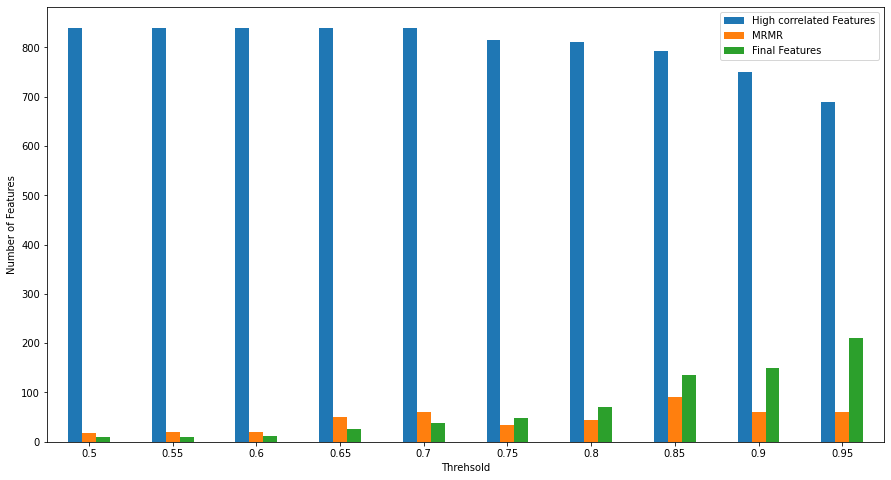

In [79]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/Energy/feature_reduction_Energy.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [80]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [81]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/Energy/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

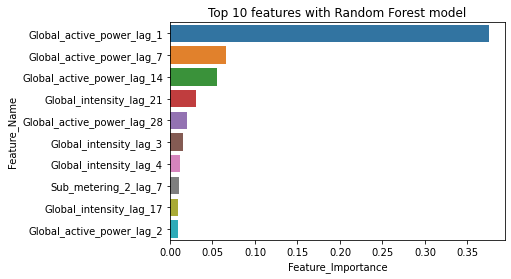

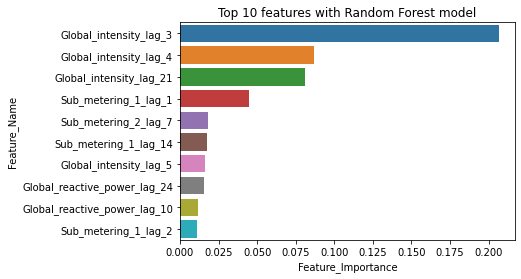

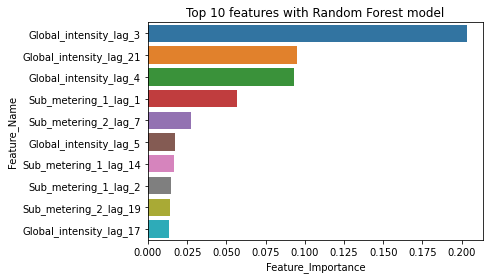

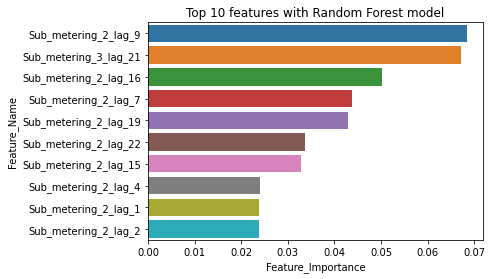

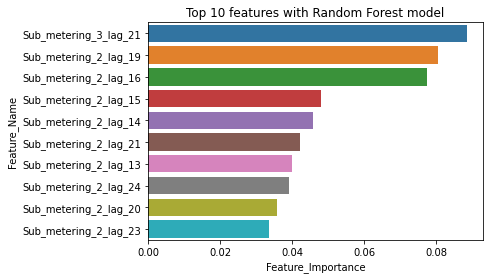

{14: ['Sub_metering_1_lag_1',
  'Global_active_power_lag_7',
  'Global_intensity_lag_3',
  'Global_intensity_lag_4',
  'Global_intensity_lag_5',
  'Sub_metering_2_lag_2',
  'Sub_metering_2_lag_7',
  'Sub_metering_2_lag_18',
  'Sub_metering_2_lag_21',
  'Sub_metering_1_lag_14',
  'Sub_metering_2_lag_11',
  'Sub_metering_1_lag_7',
  'Global_intensity_lag_8',
  'Sub_metering_2_lag_14',
  'Global_active_power_lag_13',
  'Sub_metering_2_lag_16',
  'Global_intensity_lag_21',
  'Sub_metering_2_lag_15',
  'Global_active_power_lag_14',
  'Sub_metering_2_lag_22',
  'Global_active_power_lag_2',
  'Sub_metering_1_lag_2',
  'Global_reactive_power_lag_24',
  'Sub_metering_2_lag_17',
  'Global_reactive_power_lag_10',
  'Sub_metering_2_lag_13',
  'Sub_metering_2_lag_9',
  'Sub_metering_2_lag_10',
  'Sub_metering_2_lag_24',
  'Global_intensity_lag_11',
  'Global_reactive_power_lag_11',
  'Sub_metering_2_lag_8',
  'Sub_metering_2_lag_1',
  'Sub_metering_2_lag_19',
  'Sub_metering_3_lag_21',
  'Sub_meter

In [660]:
rfr_recursive(feature_collections[0.75],14,14,X_train_lag,Y_train_lag)

In [82]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [83]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [84]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [85]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [86]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.101503
[2]	valid_0's l2: 0.092567
[3]	valid_0's l2: 0.0845479
[4]	valid_0's l2: 0.0783972
[5]	valid_0's l2: 0.0725034
[6]	valid_0's l2: 0.0683184
[7]	valid_0's l2: 0.0644689
[8]	valid_0's l2: 0.0613559
[9]	valid_0's l2: 0.0591906
[10]	valid_0's l2: 0.0569644
[11]	valid_0's l2: 0.0552136
[12]	valid_0's l2: 0.0533217
[13]	valid_0's l2: 0.0516955
[14]	valid_0's l2: 0.0509528
[15]	valid_0's l2: 0.0510269
[16]	valid_0's l2: 0.0500959
[17]	valid_0's l2: 0.0493455
[18]	valid_0's l2: 0.0491977
[19]	valid_0's l2: 0.0488943
[20]	valid_0's l2: 0.0483243
[21]	valid_0's l2: 0.0473387
[22]	valid_0's l2: 0.0470627
[23]	valid_0's l2: 0.0474212
[24]	valid_0's l2: 0.0463499
[25]	valid_0's l2: 0.0456887
[26]	valid_0's l2: 0.0455027
[27]	valid_0's l2: 0.0453362
[28]	valid_0's l2: 0.0452057
[29]	valid_0's l2: 0.0451304
[30]	valid_0's l2: 0.0454392
[31]	valid_0's l2: 0.0452423
[32]	valid_0's l2: 0.0447623
[33]	valid_0's l2: 0.0446837
[34]	valid_0's l2: 0.0446702
[35]	valid_0's l2: 0.0447

[40]	valid_0's l2: 0.0448146
[41]	valid_0's l2: 0.0448498
[42]	valid_0's l2: 0.0448116
[43]	valid_0's l2: 0.0448009
[44]	valid_0's l2: 0.0448291
[45]	valid_0's l2: 0.0448907
[46]	valid_0's l2: 0.0449005
[47]	valid_0's l2: 0.0449284
[48]	valid_0's l2: 0.0450046
[49]	valid_0's l2: 0.0450323
[50]	valid_0's l2: 0.0450644
[51]	valid_0's l2: 0.045274
[52]	valid_0's l2: 0.0452364
[53]	valid_0's l2: 0.0451847
[1]	valid_0's l2: 0.0990877
[2]	valid_0's l2: 0.0885852
[3]	valid_0's l2: 0.0798536
[4]	valid_0's l2: 0.0717568
[5]	valid_0's l2: 0.0654309
[6]	valid_0's l2: 0.0604721
[7]	valid_0's l2: 0.0568584
[8]	valid_0's l2: 0.0537143
[9]	valid_0's l2: 0.0508509
[10]	valid_0's l2: 0.0484513
[11]	valid_0's l2: 0.0464611
[12]	valid_0's l2: 0.0448762
[13]	valid_0's l2: 0.0433039
[14]	valid_0's l2: 0.0429825
[15]	valid_0's l2: 0.0420452
[16]	valid_0's l2: 0.0412674
[17]	valid_0's l2: 0.0401684
[18]	valid_0's l2: 0.0388912
[19]	valid_0's l2: 0.0382566
[20]	valid_0's l2: 0.0376258
[21]	valid_0's l2: 0.037

[2]	valid_0's l2: 0.108872
[3]	valid_0's l2: 0.107928
[4]	valid_0's l2: 0.107432
[5]	valid_0's l2: 0.106764
[6]	valid_0's l2: 0.106831
[7]	valid_0's l2: 0.106692
[8]	valid_0's l2: 0.107081
[9]	valid_0's l2: 0.107245
[10]	valid_0's l2: 0.107485
[11]	valid_0's l2: 0.108021
[12]	valid_0's l2: 0.108281
[13]	valid_0's l2: 0.108558
[14]	valid_0's l2: 0.109172
[15]	valid_0's l2: 0.109345
[16]	valid_0's l2: 0.10955
[17]	valid_0's l2: 0.109865
[1]	valid_0's l2: 0.100326
[2]	valid_0's l2: 0.0903814
[3]	valid_0's l2: 0.0831719
[4]	valid_0's l2: 0.0766139
[5]	valid_0's l2: 0.0717442
[6]	valid_0's l2: 0.0677663
[7]	valid_0's l2: 0.0638828
[8]	valid_0's l2: 0.0608586
[9]	valid_0's l2: 0.0579251
[10]	valid_0's l2: 0.0560245
[11]	valid_0's l2: 0.0545909
[12]	valid_0's l2: 0.0539828
[13]	valid_0's l2: 0.0525398
[14]	valid_0's l2: 0.0516855
[15]	valid_0's l2: 0.0509321
[16]	valid_0's l2: 0.0496001
[17]	valid_0's l2: 0.0493741
[18]	valid_0's l2: 0.0489031
[19]	valid_0's l2: 0.0485752
[20]	valid_0's l2: 0

[2]	valid_0's l2: 0.0899284
[3]	valid_0's l2: 0.0824411
[4]	valid_0's l2: 0.0753646
[5]	valid_0's l2: 0.0701291
[6]	valid_0's l2: 0.0651834
[7]	valid_0's l2: 0.0616006
[8]	valid_0's l2: 0.0581431
[9]	valid_0's l2: 0.0555562
[10]	valid_0's l2: 0.0541316
[11]	valid_0's l2: 0.0519016
[12]	valid_0's l2: 0.0500346
[13]	valid_0's l2: 0.04921
[14]	valid_0's l2: 0.0481599
[15]	valid_0's l2: 0.0473038
[16]	valid_0's l2: 0.0472078
[17]	valid_0's l2: 0.0465868
[18]	valid_0's l2: 0.0456652
[19]	valid_0's l2: 0.0452272
[20]	valid_0's l2: 0.0448797
[21]	valid_0's l2: 0.0441577
[22]	valid_0's l2: 0.0442035
[23]	valid_0's l2: 0.0440469
[24]	valid_0's l2: 0.0447304
[25]	valid_0's l2: 0.0445232
[26]	valid_0's l2: 0.0446168
[27]	valid_0's l2: 0.0447217
[28]	valid_0's l2: 0.0448328
[29]	valid_0's l2: 0.0443646
[30]	valid_0's l2: 0.0445017
[31]	valid_0's l2: 0.044635
[32]	valid_0's l2: 0.0446488
[33]	valid_0's l2: 0.0448913
[1]	valid_0's l2: 0.101096
[2]	valid_0's l2: 0.0917047
[3]	valid_0's l2: 0.083929
[

[1]	valid_0's l2: 0.100581
[2]	valid_0's l2: 0.0894872
[3]	valid_0's l2: 0.0827098
[4]	valid_0's l2: 0.0760234
[5]	valid_0's l2: 0.0690782
[6]	valid_0's l2: 0.063147
[7]	valid_0's l2: 0.0588219
[8]	valid_0's l2: 0.056979
[9]	valid_0's l2: 0.054972
[10]	valid_0's l2: 0.0525463
[11]	valid_0's l2: 0.0512005
[12]	valid_0's l2: 0.0500214
[13]	valid_0's l2: 0.0492609
[14]	valid_0's l2: 0.0480604
[15]	valid_0's l2: 0.0472308
[16]	valid_0's l2: 0.0461157
[17]	valid_0's l2: 0.0449618
[18]	valid_0's l2: 0.0440576
[19]	valid_0's l2: 0.0423693
[20]	valid_0's l2: 0.0409518
[21]	valid_0's l2: 0.0400917
[22]	valid_0's l2: 0.0388579
[23]	valid_0's l2: 0.0380889
[24]	valid_0's l2: 0.0374168
[25]	valid_0's l2: 0.0372061
[26]	valid_0's l2: 0.0372077
[27]	valid_0's l2: 0.0371016
[28]	valid_0's l2: 0.0363457
[29]	valid_0's l2: 0.036536
[30]	valid_0's l2: 0.0365156
[31]	valid_0's l2: 0.0360284
[32]	valid_0's l2: 0.0351958
[33]	valid_0's l2: 0.0351506
[34]	valid_0's l2: 0.0349603
[35]	valid_0's l2: 0.0345427

[32]	valid_0's l2: 0.0351958
[33]	valid_0's l2: 0.0351506
[34]	valid_0's l2: 0.0349603
[35]	valid_0's l2: 0.0345427
[36]	valid_0's l2: 0.0341304
[37]	valid_0's l2: 0.0343423
[38]	valid_0's l2: 0.0344394
[39]	valid_0's l2: 0.0345395
[40]	valid_0's l2: 0.0346853
[41]	valid_0's l2: 0.0346399
[42]	valid_0's l2: 0.0351784
[43]	valid_0's l2: 0.035729
[44]	valid_0's l2: 0.0356799
[45]	valid_0's l2: 0.0355678
[46]	valid_0's l2: 0.0360352
[1]	valid_0's l2: 0.102268
[2]	valid_0's l2: 0.0922319
[3]	valid_0's l2: 0.0840273
[4]	valid_0's l2: 0.0784981
[5]	valid_0's l2: 0.0724115
[6]	valid_0's l2: 0.0673219
[7]	valid_0's l2: 0.064856
[8]	valid_0's l2: 0.0634159
[9]	valid_0's l2: 0.0613777
[10]	valid_0's l2: 0.0599738
[11]	valid_0's l2: 0.0591688
[12]	valid_0's l2: 0.0569082
[13]	valid_0's l2: 0.0553107
[14]	valid_0's l2: 0.0550711
[15]	valid_0's l2: 0.0539026
[16]	valid_0's l2: 0.0541559
[17]	valid_0's l2: 0.0527693
[18]	valid_0's l2: 0.051566
[19]	valid_0's l2: 0.051025
[20]	valid_0's l2: 0.050072


[2]	valid_0's l2: 0.0930516
[3]	valid_0's l2: 0.0857487
[4]	valid_0's l2: 0.0801321
[5]	valid_0's l2: 0.0741159
[6]	valid_0's l2: 0.0699512
[7]	valid_0's l2: 0.0664965
[8]	valid_0's l2: 0.0643624
[9]	valid_0's l2: 0.0624492
[10]	valid_0's l2: 0.0611531
[11]	valid_0's l2: 0.0592175
[12]	valid_0's l2: 0.0585611
[13]	valid_0's l2: 0.0571729
[14]	valid_0's l2: 0.0558544
[15]	valid_0's l2: 0.0553234
[16]	valid_0's l2: 0.0550378
[17]	valid_0's l2: 0.0551488
[18]	valid_0's l2: 0.0544883
[19]	valid_0's l2: 0.0539684
[20]	valid_0's l2: 0.0530163
[21]	valid_0's l2: 0.0521467
[22]	valid_0's l2: 0.0514677
[23]	valid_0's l2: 0.0516306
[24]	valid_0's l2: 0.0516929
[25]	valid_0's l2: 0.0520283
[26]	valid_0's l2: 0.051443
[27]	valid_0's l2: 0.051777
[28]	valid_0's l2: 0.0510668
[29]	valid_0's l2: 0.0512992
[30]	valid_0's l2: 0.0515514
[31]	valid_0's l2: 0.0514275
[32]	valid_0's l2: 0.0519288
[33]	valid_0's l2: 0.0521651
[34]	valid_0's l2: 0.0519577
[35]	valid_0's l2: 0.0517229
[36]	valid_0's l2: 0.052

[9]	valid_0's l2: 0.0595036
[10]	valid_0's l2: 0.0584965
[11]	valid_0's l2: 0.0570962
[12]	valid_0's l2: 0.0556276
[13]	valid_0's l2: 0.0548594
[14]	valid_0's l2: 0.054338
[15]	valid_0's l2: 0.0536532
[16]	valid_0's l2: 0.052872
[17]	valid_0's l2: 0.0523989
[18]	valid_0's l2: 0.0520161
[19]	valid_0's l2: 0.0518326
[20]	valid_0's l2: 0.0507081
[21]	valid_0's l2: 0.0500569
[22]	valid_0's l2: 0.0496019
[23]	valid_0's l2: 0.0496362
[24]	valid_0's l2: 0.0493106
[25]	valid_0's l2: 0.0493097
[26]	valid_0's l2: 0.049125
[27]	valid_0's l2: 0.0493137
[28]	valid_0's l2: 0.0490341
[29]	valid_0's l2: 0.0487575
[30]	valid_0's l2: 0.0482669
[31]	valid_0's l2: 0.0484972
[32]	valid_0's l2: 0.0489689
[33]	valid_0's l2: 0.0497254
[34]	valid_0's l2: 0.0492497
[35]	valid_0's l2: 0.0498652
[36]	valid_0's l2: 0.0502571
[37]	valid_0's l2: 0.0502646
[38]	valid_0's l2: 0.050239
[39]	valid_0's l2: 0.0505201
[40]	valid_0's l2: 0.0497543
[1]	valid_0's l2: 0.112134
[2]	valid_0's l2: 0.112323
[3]	valid_0's l2: 0.112

[2]	valid_0's l2: 0.112323
[3]	valid_0's l2: 0.112184
[4]	valid_0's l2: 0.112987
[5]	valid_0's l2: 0.112283
[6]	valid_0's l2: 0.111339
[7]	valid_0's l2: 0.111263
[8]	valid_0's l2: 0.111393
[9]	valid_0's l2: 0.111473
[10]	valid_0's l2: 0.111564
[11]	valid_0's l2: 0.111048
[12]	valid_0's l2: 0.111475
[13]	valid_0's l2: 0.110686
[14]	valid_0's l2: 0.110236
[15]	valid_0's l2: 0.109428
[16]	valid_0's l2: 0.109224
[17]	valid_0's l2: 0.108438
[18]	valid_0's l2: 0.107797
[19]	valid_0's l2: 0.107845
[20]	valid_0's l2: 0.107714
[21]	valid_0's l2: 0.107611
[22]	valid_0's l2: 0.107479
[23]	valid_0's l2: 0.107112
[24]	valid_0's l2: 0.1072
[25]	valid_0's l2: 0.10735
[26]	valid_0's l2: 0.10723
[27]	valid_0's l2: 0.106885
[28]	valid_0's l2: 0.106759
[29]	valid_0's l2: 0.107283
[30]	valid_0's l2: 0.107523
[31]	valid_0's l2: 0.107035
[32]	valid_0's l2: 0.106678
[33]	valid_0's l2: 0.106389
[34]	valid_0's l2: 0.105892
[35]	valid_0's l2: 0.106305
[36]	valid_0's l2: 0.106065
[37]	valid_0's l2: 0.105596
[38]

[1]	valid_0's l2: 0.100581
[2]	valid_0's l2: 0.0894872
[3]	valid_0's l2: 0.0827098
[4]	valid_0's l2: 0.0760234
[5]	valid_0's l2: 0.0690782
[6]	valid_0's l2: 0.063147
[7]	valid_0's l2: 0.0588219
[8]	valid_0's l2: 0.056979
[9]	valid_0's l2: 0.054972
[10]	valid_0's l2: 0.0525463
[11]	valid_0's l2: 0.0512005
[12]	valid_0's l2: 0.0500214
[13]	valid_0's l2: 0.0492609
[14]	valid_0's l2: 0.0480604
[15]	valid_0's l2: 0.0472308
[16]	valid_0's l2: 0.0461157
[17]	valid_0's l2: 0.0449618
[18]	valid_0's l2: 0.0440576
[19]	valid_0's l2: 0.0423693
[20]	valid_0's l2: 0.0409518
[21]	valid_0's l2: 0.0400917
[22]	valid_0's l2: 0.0388579
[23]	valid_0's l2: 0.0380889
[24]	valid_0's l2: 0.0374168
[25]	valid_0's l2: 0.0372061
[26]	valid_0's l2: 0.0372077
[27]	valid_0's l2: 0.0371016
[28]	valid_0's l2: 0.0363457
[29]	valid_0's l2: 0.036536
[30]	valid_0's l2: 0.0365156
[31]	valid_0's l2: 0.0360284
[32]	valid_0's l2: 0.0351958
[33]	valid_0's l2: 0.0351506
[34]	valid_0's l2: 0.0349603
[35]	valid_0's l2: 0.0345427

[1]	valid_0's l2: 0.102268
[2]	valid_0's l2: 0.0922319
[3]	valid_0's l2: 0.0840273
[4]	valid_0's l2: 0.0784981
[5]	valid_0's l2: 0.0724115
[6]	valid_0's l2: 0.0673219
[7]	valid_0's l2: 0.064856
[8]	valid_0's l2: 0.0634159
[9]	valid_0's l2: 0.0613777
[10]	valid_0's l2: 0.0599738
[11]	valid_0's l2: 0.0591688
[12]	valid_0's l2: 0.0569082
[13]	valid_0's l2: 0.0553107
[14]	valid_0's l2: 0.0550711
[15]	valid_0's l2: 0.0539026
[16]	valid_0's l2: 0.0541559
[17]	valid_0's l2: 0.0527693
[18]	valid_0's l2: 0.051566
[19]	valid_0's l2: 0.051025
[20]	valid_0's l2: 0.050072
[21]	valid_0's l2: 0.0497223
[22]	valid_0's l2: 0.0490002
[23]	valid_0's l2: 0.0477011
[24]	valid_0's l2: 0.0480617
[25]	valid_0's l2: 0.0473923
[26]	valid_0's l2: 0.0478728
[27]	valid_0's l2: 0.0477981
[28]	valid_0's l2: 0.048371
[29]	valid_0's l2: 0.0486127
[30]	valid_0's l2: 0.0490189
[31]	valid_0's l2: 0.0490244
[32]	valid_0's l2: 0.0492606
[33]	valid_0's l2: 0.0485511
[34]	valid_0's l2: 0.0488175
[35]	valid_0's l2: 0.0493825


[22]	valid_0's l2: 0.0514677
[23]	valid_0's l2: 0.0516306
[24]	valid_0's l2: 0.0516929
[25]	valid_0's l2: 0.0520283
[26]	valid_0's l2: 0.051443
[27]	valid_0's l2: 0.051777
[28]	valid_0's l2: 0.0510668
[29]	valid_0's l2: 0.0512992
[30]	valid_0's l2: 0.0515514
[31]	valid_0's l2: 0.0514275
[32]	valid_0's l2: 0.0519288
[33]	valid_0's l2: 0.0521651
[34]	valid_0's l2: 0.0519577
[35]	valid_0's l2: 0.0517229
[36]	valid_0's l2: 0.0522439
[37]	valid_0's l2: 0.0520703
[38]	valid_0's l2: 0.0522319
[1]	valid_0's l2: 0.102117
[2]	valid_0's l2: 0.0918296
[3]	valid_0's l2: 0.0843743
[4]	valid_0's l2: 0.0787426
[5]	valid_0's l2: 0.0727894
[6]	valid_0's l2: 0.0677859
[7]	valid_0's l2: 0.0637479
[8]	valid_0's l2: 0.0621356
[9]	valid_0's l2: 0.0595036
[10]	valid_0's l2: 0.0584965
[11]	valid_0's l2: 0.0570962
[12]	valid_0's l2: 0.0556276
[13]	valid_0's l2: 0.0548594
[14]	valid_0's l2: 0.054338
[15]	valid_0's l2: 0.0536532
[16]	valid_0's l2: 0.052872
[17]	valid_0's l2: 0.0523989
[18]	valid_0's l2: 0.0520161

[2]	valid_0's l2: 0.0931845
[3]	valid_0's l2: 0.0861338
[4]	valid_0's l2: 0.0799989
[5]	valid_0's l2: 0.0741422
[6]	valid_0's l2: 0.0693362
[7]	valid_0's l2: 0.0658159
[8]	valid_0's l2: 0.0628249
[9]	valid_0's l2: 0.0603477
[10]	valid_0's l2: 0.0576176
[11]	valid_0's l2: 0.0558257
[12]	valid_0's l2: 0.0543791
[13]	valid_0's l2: 0.0527637
[14]	valid_0's l2: 0.0517774
[15]	valid_0's l2: 0.050854
[16]	valid_0's l2: 0.0490356
[17]	valid_0's l2: 0.047951
[18]	valid_0's l2: 0.04762
[19]	valid_0's l2: 0.0465405
[20]	valid_0's l2: 0.0448718
[21]	valid_0's l2: 0.0434611
[22]	valid_0's l2: 0.0423913
[23]	valid_0's l2: 0.0423718
[24]	valid_0's l2: 0.0421735
[25]	valid_0's l2: 0.0418978
[26]	valid_0's l2: 0.0416052
[27]	valid_0's l2: 0.0414914
[28]	valid_0's l2: 0.0413134
[29]	valid_0's l2: 0.0411163
[30]	valid_0's l2: 0.0413248
[31]	valid_0's l2: 0.0409128
[32]	valid_0's l2: 0.0408646
[33]	valid_0's l2: 0.0408012
[34]	valid_0's l2: 0.0404588
[35]	valid_0's l2: 0.0401742
[36]	valid_0's l2: 0.04033

[1]	valid_0's l2: 0.0992203
[2]	valid_0's l2: 0.0883264
[3]	valid_0's l2: 0.0791429
[4]	valid_0's l2: 0.0726918
[5]	valid_0's l2: 0.0666919
[6]	valid_0's l2: 0.0625648
[7]	valid_0's l2: 0.0580871
[8]	valid_0's l2: 0.0546743
[9]	valid_0's l2: 0.0533452
[10]	valid_0's l2: 0.0506066
[11]	valid_0's l2: 0.047781
[12]	valid_0's l2: 0.0459085
[13]	valid_0's l2: 0.0441333
[14]	valid_0's l2: 0.0428381
[15]	valid_0's l2: 0.0415022
[16]	valid_0's l2: 0.0407989
[17]	valid_0's l2: 0.0398001
[18]	valid_0's l2: 0.038877
[19]	valid_0's l2: 0.0386195
[20]	valid_0's l2: 0.0384203
[21]	valid_0's l2: 0.0385983
[22]	valid_0's l2: 0.0384687
[23]	valid_0's l2: 0.0385834
[24]	valid_0's l2: 0.0383933
[25]	valid_0's l2: 0.0384297
[26]	valid_0's l2: 0.0386074
[27]	valid_0's l2: 0.0389763
[28]	valid_0's l2: 0.0384327
[29]	valid_0's l2: 0.0384839
[30]	valid_0's l2: 0.0380011
[31]	valid_0's l2: 0.037681
[32]	valid_0's l2: 0.0371835
[33]	valid_0's l2: 0.0373721
[34]	valid_0's l2: 0.0377129
[35]	valid_0's l2: 0.03758

[23]	valid_0's l2: 0.0408171
[24]	valid_0's l2: 0.0402951
[25]	valid_0's l2: 0.0396007
[26]	valid_0's l2: 0.0391705
[27]	valid_0's l2: 0.0393778
[28]	valid_0's l2: 0.0389035
[29]	valid_0's l2: 0.0387391
[30]	valid_0's l2: 0.0391436
[31]	valid_0's l2: 0.0390195
[32]	valid_0's l2: 0.0393977
[33]	valid_0's l2: 0.0389349
[34]	valid_0's l2: 0.0385237
[35]	valid_0's l2: 0.0383456
[36]	valid_0's l2: 0.0382027
[37]	valid_0's l2: 0.03807
[38]	valid_0's l2: 0.0381344
[39]	valid_0's l2: 0.0384021
[40]	valid_0's l2: 0.0384846
[41]	valid_0's l2: 0.0387975
[42]	valid_0's l2: 0.0392559
[43]	valid_0's l2: 0.0397112
[44]	valid_0's l2: 0.0395756
[45]	valid_0's l2: 0.0395872
[46]	valid_0's l2: 0.0398571
[47]	valid_0's l2: 0.0402118
[1]	valid_0's l2: 0.0989396
[2]	valid_0's l2: 0.0877885
[3]	valid_0's l2: 0.0794469
[4]	valid_0's l2: 0.0715923
[5]	valid_0's l2: 0.0657815
[6]	valid_0's l2: 0.060972
[7]	valid_0's l2: 0.0564723
[8]	valid_0's l2: 0.0527727
[9]	valid_0's l2: 0.0491057
[10]	valid_0's l2: 0.04708

[2]	valid_0's l2: 0.0897717
[3]	valid_0's l2: 0.0802632
[4]	valid_0's l2: 0.0728022
[5]	valid_0's l2: 0.0668909
[6]	valid_0's l2: 0.0622381
[7]	valid_0's l2: 0.0580949
[8]	valid_0's l2: 0.0544007
[9]	valid_0's l2: 0.0512688
[10]	valid_0's l2: 0.0478624
[11]	valid_0's l2: 0.0458527
[12]	valid_0's l2: 0.044765
[13]	valid_0's l2: 0.0432488
[14]	valid_0's l2: 0.042477
[15]	valid_0's l2: 0.0422693
[16]	valid_0's l2: 0.0424159
[17]	valid_0's l2: 0.0414276
[18]	valid_0's l2: 0.0405967
[19]	valid_0's l2: 0.0397317
[20]	valid_0's l2: 0.039492
[21]	valid_0's l2: 0.0382544
[22]	valid_0's l2: 0.0383132
[23]	valid_0's l2: 0.0371141
[24]	valid_0's l2: 0.0362405
[25]	valid_0's l2: 0.0368168
[26]	valid_0's l2: 0.0369449
[27]	valid_0's l2: 0.0360869
[28]	valid_0's l2: 0.0365884
[29]	valid_0's l2: 0.0363133
[30]	valid_0's l2: 0.0362335
[31]	valid_0's l2: 0.0361076
[32]	valid_0's l2: 0.0362164
[33]	valid_0's l2: 0.0361067
[34]	valid_0's l2: 0.036415
[35]	valid_0's l2: 0.0367962
[36]	valid_0's l2: 0.03644

[75]	valid_0's l2: 0.0386162
[1]	valid_0's l2: 0.0992203
[2]	valid_0's l2: 0.0883264
[3]	valid_0's l2: 0.0791429
[4]	valid_0's l2: 0.0726918
[5]	valid_0's l2: 0.0666919
[6]	valid_0's l2: 0.0625648
[7]	valid_0's l2: 0.0580871
[8]	valid_0's l2: 0.0546743
[9]	valid_0's l2: 0.0533452
[10]	valid_0's l2: 0.0506066
[11]	valid_0's l2: 0.047781
[12]	valid_0's l2: 0.0459085
[13]	valid_0's l2: 0.0441333
[14]	valid_0's l2: 0.0428381
[15]	valid_0's l2: 0.0415022
[16]	valid_0's l2: 0.0407989
[17]	valid_0's l2: 0.0398001
[18]	valid_0's l2: 0.038877
[19]	valid_0's l2: 0.0386195
[20]	valid_0's l2: 0.0384203
[21]	valid_0's l2: 0.0385983
[22]	valid_0's l2: 0.0384687
[23]	valid_0's l2: 0.0385834
[24]	valid_0's l2: 0.0383933
[25]	valid_0's l2: 0.0384297
[26]	valid_0's l2: 0.0386074
[27]	valid_0's l2: 0.0389763
[28]	valid_0's l2: 0.0384327
[29]	valid_0's l2: 0.0384839
[30]	valid_0's l2: 0.0380011
[31]	valid_0's l2: 0.037681
[32]	valid_0's l2: 0.0371835
[33]	valid_0's l2: 0.0373721
[34]	valid_0's l2: 0.03771

[2]	valid_0's l2: 0.0893352
[3]	valid_0's l2: 0.0808736
[4]	valid_0's l2: 0.0736758
[5]	valid_0's l2: 0.0672739
[6]	valid_0's l2: 0.0630645
[7]	valid_0's l2: 0.0591392
[8]	valid_0's l2: 0.0550915
[9]	valid_0's l2: 0.0538388
[10]	valid_0's l2: 0.0506907
[11]	valid_0's l2: 0.048567
[12]	valid_0's l2: 0.0463212
[13]	valid_0's l2: 0.0448729
[14]	valid_0's l2: 0.0436863
[15]	valid_0's l2: 0.0427671
[16]	valid_0's l2: 0.0420365
[17]	valid_0's l2: 0.0418362
[18]	valid_0's l2: 0.0411491
[19]	valid_0's l2: 0.0408045
[20]	valid_0's l2: 0.0406335
[21]	valid_0's l2: 0.0405147
[22]	valid_0's l2: 0.0407137
[23]	valid_0's l2: 0.0408171
[24]	valid_0's l2: 0.0402951
[25]	valid_0's l2: 0.0396007
[26]	valid_0's l2: 0.0391705
[27]	valid_0's l2: 0.0393778
[28]	valid_0's l2: 0.0389035
[29]	valid_0's l2: 0.0387391
[30]	valid_0's l2: 0.0391436
[31]	valid_0's l2: 0.0390195
[32]	valid_0's l2: 0.0393977
[33]	valid_0's l2: 0.0389349
[34]	valid_0's l2: 0.0385237
[35]	valid_0's l2: 0.0383456
[36]	valid_0's l2: 0.03

[2]	valid_0's l2: 0.0877885
[3]	valid_0's l2: 0.0794469
[4]	valid_0's l2: 0.0715923
[5]	valid_0's l2: 0.0657815
[6]	valid_0's l2: 0.060972
[7]	valid_0's l2: 0.0564723
[8]	valid_0's l2: 0.0527727
[9]	valid_0's l2: 0.0491057
[10]	valid_0's l2: 0.0470861
[11]	valid_0's l2: 0.0453363
[12]	valid_0's l2: 0.0442006
[13]	valid_0's l2: 0.0432546
[14]	valid_0's l2: 0.0409282
[15]	valid_0's l2: 0.0395374
[16]	valid_0's l2: 0.0391308
[17]	valid_0's l2: 0.038222
[18]	valid_0's l2: 0.0367251
[19]	valid_0's l2: 0.0358866
[20]	valid_0's l2: 0.0357367
[21]	valid_0's l2: 0.0351269
[22]	valid_0's l2: 0.0351068
[23]	valid_0's l2: 0.0344922
[24]	valid_0's l2: 0.0345945
[25]	valid_0's l2: 0.0341186
[26]	valid_0's l2: 0.0336751
[27]	valid_0's l2: 0.0335958
[28]	valid_0's l2: 0.0333201
[29]	valid_0's l2: 0.0332585
[30]	valid_0's l2: 0.0331084
[31]	valid_0's l2: 0.0329135
[32]	valid_0's l2: 0.0323908
[33]	valid_0's l2: 0.0322872
[34]	valid_0's l2: 0.0324142
[35]	valid_0's l2: 0.0329142
[36]	valid_0's l2: 0.032

[5]	valid_0's l2: 0.0668909
[6]	valid_0's l2: 0.0622381
[7]	valid_0's l2: 0.0580949
[8]	valid_0's l2: 0.0544007
[9]	valid_0's l2: 0.0512688
[10]	valid_0's l2: 0.0478624
[11]	valid_0's l2: 0.0458527
[12]	valid_0's l2: 0.044765
[13]	valid_0's l2: 0.0432488
[14]	valid_0's l2: 0.042477
[15]	valid_0's l2: 0.0422693
[16]	valid_0's l2: 0.0424159
[17]	valid_0's l2: 0.0414276
[18]	valid_0's l2: 0.0405967
[19]	valid_0's l2: 0.0397317
[20]	valid_0's l2: 0.039492
[21]	valid_0's l2: 0.0382544
[22]	valid_0's l2: 0.0383132
[23]	valid_0's l2: 0.0371141
[24]	valid_0's l2: 0.0362405
[25]	valid_0's l2: 0.0368168
[26]	valid_0's l2: 0.0369449
[27]	valid_0's l2: 0.0360869
[28]	valid_0's l2: 0.0365884
[29]	valid_0's l2: 0.0363133
[30]	valid_0's l2: 0.0362335
[31]	valid_0's l2: 0.0361076
[32]	valid_0's l2: 0.0362164
[33]	valid_0's l2: 0.0361067
[34]	valid_0's l2: 0.036415
[35]	valid_0's l2: 0.0367962
[36]	valid_0's l2: 0.0364442
[37]	valid_0's l2: 0.0364532
[1]	valid_0's l2: 0.101741
[2]	valid_0's l2: 0.09318

[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080928
[4]	valid_0's l2: 0.0721074
[5]	valid_0's l2: 0.0660948
[6]	valid_0's l2: 0.060405
[7]	valid_0's l2: 0.0562042
[8]	valid_0's l2: 0.0519047
[9]	valid_0's l2: 0.0482713
[10]	valid_0's l2: 0.0457062
[11]	valid_0's l2: 0.0431467
[12]	valid_0's l2: 0.0409148
[13]	valid_0's l2: 0.0385896
[14]	valid_0's l2: 0.0362219
[15]	valid_0's l2: 0.0346015
[16]	valid_0's l2: 0.0334588
[17]	valid_0's l2: 0.0328884
[18]	valid_0's l2: 0.0321551
[19]	valid_0's l2: 0.0311637
[20]	valid_0's l2: 0.0307919
[21]	valid_0's l2: 0.0306111
[22]	valid_0's l2: 0.0305328
[23]	valid_0's l2: 0.0303882
[24]	valid_0's l2: 0.0299492
[25]	valid_0's l2: 0.0299335
[26]	valid_0's l2: 0.0299469
[27]	valid_0's l2: 0.0300007
[28]	valid_0's l2: 0.0300102
[29]	valid_0's l2: 0.0301002
[30]	valid_0's l2: 0.0297318
[31]	valid_0's l2: 0.0296117
[32]	valid_0's l2: 0.0293593
[33]	valid_0's l2: 0.0291029
[34]	valid_0's l2: 0.0291658
[35]	valid_0's l2: 0.0289869
[36]	valid_0's l2: 0.028

[2]	valid_0's l2: 0.0935471
[3]	valid_0's l2: 0.0861896
[4]	valid_0's l2: 0.0792629
[5]	valid_0's l2: 0.0743448
[6]	valid_0's l2: 0.0694027
[7]	valid_0's l2: 0.065008
[8]	valid_0's l2: 0.0621674
[9]	valid_0's l2: 0.0599938
[10]	valid_0's l2: 0.0579015
[11]	valid_0's l2: 0.0555365
[12]	valid_0's l2: 0.0536854
[13]	valid_0's l2: 0.0530059
[14]	valid_0's l2: 0.051134
[15]	valid_0's l2: 0.0503112
[16]	valid_0's l2: 0.0499258
[17]	valid_0's l2: 0.0491114
[18]	valid_0's l2: 0.0479367
[19]	valid_0's l2: 0.0475539
[20]	valid_0's l2: 0.0472753
[21]	valid_0's l2: 0.0466206
[22]	valid_0's l2: 0.0467596
[23]	valid_0's l2: 0.0467205
[24]	valid_0's l2: 0.046819
[25]	valid_0's l2: 0.0468131
[26]	valid_0's l2: 0.046982
[27]	valid_0's l2: 0.0469823
[28]	valid_0's l2: 0.0470269
[29]	valid_0's l2: 0.0470856
[30]	valid_0's l2: 0.0475652
[31]	valid_0's l2: 0.0475824
[1]	valid_0's l2: 0.099458
[2]	valid_0's l2: 0.0868919
[3]	valid_0's l2: 0.077526
[4]	valid_0's l2: 0.0695073
[5]	valid_0's l2: 0.0632377
[6]	

[1]	valid_0's l2: 0.099458
[2]	valid_0's l2: 0.0868919
[3]	valid_0's l2: 0.077526
[4]	valid_0's l2: 0.0695073
[5]	valid_0's l2: 0.0632377
[6]	valid_0's l2: 0.0578893
[7]	valid_0's l2: 0.053229
[8]	valid_0's l2: 0.0508196
[9]	valid_0's l2: 0.0472144
[10]	valid_0's l2: 0.044143
[11]	valid_0's l2: 0.0430384
[12]	valid_0's l2: 0.0407607
[13]	valid_0's l2: 0.0388245
[14]	valid_0's l2: 0.0362682
[15]	valid_0's l2: 0.0345038
[16]	valid_0's l2: 0.0336955
[17]	valid_0's l2: 0.0329213
[18]	valid_0's l2: 0.0317736
[19]	valid_0's l2: 0.0310995
[20]	valid_0's l2: 0.0302388
[21]	valid_0's l2: 0.0301458
[22]	valid_0's l2: 0.0302978
[23]	valid_0's l2: 0.0303785
[24]	valid_0's l2: 0.0305402
[25]	valid_0's l2: 0.0303913
[26]	valid_0's l2: 0.0299541
[27]	valid_0's l2: 0.0299748
[28]	valid_0's l2: 0.0295088
[29]	valid_0's l2: 0.0298063
[30]	valid_0's l2: 0.0297881
[31]	valid_0's l2: 0.0295238
[32]	valid_0's l2: 0.0292717
[33]	valid_0's l2: 0.0291152
[34]	valid_0's l2: 0.0292033
[35]	valid_0's l2: 0.029003

[20]	valid_0's l2: 0.0302388
[21]	valid_0's l2: 0.0301458
[22]	valid_0's l2: 0.0302978
[23]	valid_0's l2: 0.0303785
[24]	valid_0's l2: 0.0305402
[25]	valid_0's l2: 0.0303913
[26]	valid_0's l2: 0.0299541
[27]	valid_0's l2: 0.0299748
[28]	valid_0's l2: 0.0295088
[29]	valid_0's l2: 0.0298063
[30]	valid_0's l2: 0.0297881
[31]	valid_0's l2: 0.0295238
[32]	valid_0's l2: 0.0292717
[33]	valid_0's l2: 0.0291152
[34]	valid_0's l2: 0.0292033
[35]	valid_0's l2: 0.0290033
[36]	valid_0's l2: 0.0292865
[37]	valid_0's l2: 0.029453
[38]	valid_0's l2: 0.0289806
[39]	valid_0's l2: 0.0295395
[40]	valid_0's l2: 0.0296868
[41]	valid_0's l2: 0.0297971
[42]	valid_0's l2: 0.0299555
[43]	valid_0's l2: 0.0298997
[44]	valid_0's l2: 0.0301857
[45]	valid_0's l2: 0.0302203
[46]	valid_0's l2: 0.030315
[47]	valid_0's l2: 0.0305038
[48]	valid_0's l2: 0.0309325
[1]	valid_0's l2: 0.0993075
[2]	valid_0's l2: 0.0866939
[3]	valid_0's l2: 0.0772007
[4]	valid_0's l2: 0.0693529
[5]	valid_0's l2: 0.0630845
[6]	valid_0's l2: 0.0

[2]	valid_0's l2: 0.0866939
[3]	valid_0's l2: 0.0772007
[4]	valid_0's l2: 0.0693529
[5]	valid_0's l2: 0.0630845
[6]	valid_0's l2: 0.0578276
[7]	valid_0's l2: 0.0531351
[8]	valid_0's l2: 0.0507583
[9]	valid_0's l2: 0.0471803
[10]	valid_0's l2: 0.0441347
[11]	valid_0's l2: 0.0414762
[12]	valid_0's l2: 0.0389081
[13]	valid_0's l2: 0.0370003
[14]	valid_0's l2: 0.0353362
[15]	valid_0's l2: 0.0343134
[16]	valid_0's l2: 0.0329468
[17]	valid_0's l2: 0.0315824
[18]	valid_0's l2: 0.0315137
[19]	valid_0's l2: 0.0303195
[20]	valid_0's l2: 0.0302431
[21]	valid_0's l2: 0.0299892
[22]	valid_0's l2: 0.0296828
[23]	valid_0's l2: 0.0297135
[24]	valid_0's l2: 0.0297581
[25]	valid_0's l2: 0.0298495
[26]	valid_0's l2: 0.0300551
[27]	valid_0's l2: 0.0295538
[28]	valid_0's l2: 0.0289554
[29]	valid_0's l2: 0.0290463
[30]	valid_0's l2: 0.0291268
[31]	valid_0's l2: 0.0284804
[32]	valid_0's l2: 0.0286404
[33]	valid_0's l2: 0.0287109
[34]	valid_0's l2: 0.0284383
[35]	valid_0's l2: 0.0286328
[36]	valid_0's l2: 0.0

[36]	valid_0's l2: 0.0320226
[37]	valid_0's l2: 0.032102
[38]	valid_0's l2: 0.0322105
[39]	valid_0's l2: 0.0317833
[40]	valid_0's l2: 0.0317107
[41]	valid_0's l2: 0.0316262
[42]	valid_0's l2: 0.0319074
[43]	valid_0's l2: 0.0316632
[44]	valid_0's l2: 0.0317824
[45]	valid_0's l2: 0.0315726
[46]	valid_0's l2: 0.0316537
[47]	valid_0's l2: 0.0312803
[48]	valid_0's l2: 0.0313419
[49]	valid_0's l2: 0.0312842
[50]	valid_0's l2: 0.0313132
[51]	valid_0's l2: 0.0314315
[52]	valid_0's l2: 0.0314758
[53]	valid_0's l2: 0.0312827
[54]	valid_0's l2: 0.0310289
[55]	valid_0's l2: 0.0309766
[56]	valid_0's l2: 0.0309015
[57]	valid_0's l2: 0.0305426
[58]	valid_0's l2: 0.0304591
[59]	valid_0's l2: 0.0303261
[60]	valid_0's l2: 0.0301753
[61]	valid_0's l2: 0.0300729
[62]	valid_0's l2: 0.0300716
[63]	valid_0's l2: 0.0299106
[64]	valid_0's l2: 0.0299314
[65]	valid_0's l2: 0.0298949
[66]	valid_0's l2: 0.0298509
[67]	valid_0's l2: 0.0296699
[68]	valid_0's l2: 0.0296885
[69]	valid_0's l2: 0.029817
[70]	valid_0's l

[65]	valid_0's l2: 0.0298949
[66]	valid_0's l2: 0.0298509
[67]	valid_0's l2: 0.0296699
[68]	valid_0's l2: 0.0296885
[69]	valid_0's l2: 0.029817
[70]	valid_0's l2: 0.0297913
[71]	valid_0's l2: 0.0298206
[72]	valid_0's l2: 0.0297854
[73]	valid_0's l2: 0.0295672
[74]	valid_0's l2: 0.0295812
[75]	valid_0's l2: 0.0296424
[76]	valid_0's l2: 0.0294432
[77]	valid_0's l2: 0.0297082
[78]	valid_0's l2: 0.0297523
[79]	valid_0's l2: 0.0299191
[80]	valid_0's l2: 0.0298049
[81]	valid_0's l2: 0.029843
[82]	valid_0's l2: 0.0296086
[83]	valid_0's l2: 0.0296446
[84]	valid_0's l2: 0.0294622
[85]	valid_0's l2: 0.0296856
[86]	valid_0's l2: 0.0297704
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080928
[4]	valid_0's l2: 0.0721074
[5]	valid_0's l2: 0.0660948
[6]	valid_0's l2: 0.060405
[7]	valid_0's l2: 0.0562042
[8]	valid_0's l2: 0.0519047
[9]	valid_0's l2: 0.0482713
[10]	valid_0's l2: 0.0457062
[11]	valid_0's l2: 0.0431467
[12]	valid_0's l2: 0.0409148
[13]	valid_0's l2: 0.038589

[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080928
[4]	valid_0's l2: 0.0721074
[5]	valid_0's l2: 0.0660948
[6]	valid_0's l2: 0.060405
[7]	valid_0's l2: 0.0562042
[8]	valid_0's l2: 0.0519047
[9]	valid_0's l2: 0.0482713
[10]	valid_0's l2: 0.0457062
[11]	valid_0's l2: 0.0431467
[12]	valid_0's l2: 0.0409148
[13]	valid_0's l2: 0.0385896
[14]	valid_0's l2: 0.0362219
[15]	valid_0's l2: 0.0346015
[16]	valid_0's l2: 0.0334588
[17]	valid_0's l2: 0.0328884
[18]	valid_0's l2: 0.0321551
[19]	valid_0's l2: 0.0311637
[20]	valid_0's l2: 0.0307919
[21]	valid_0's l2: 0.0306111
[22]	valid_0's l2: 0.0305328
[23]	valid_0's l2: 0.0303882
[24]	valid_0's l2: 0.0299492
[25]	valid_0's l2: 0.0299335
[26]	valid_0's l2: 0.0299469
[27]	valid_0's l2: 0.0300007
[28]	valid_0's l2: 0.0300102
[29]	valid_0's l2: 0.0301002
[30]	valid_0's l2: 0.0297318
[31]	valid_0's l2: 0.0296117
[32]	valid_0's l2: 0.0293593
[33]	valid_0's l2: 0.0291029
[34]	valid_0's l2: 0.0291658
[35]	valid_0's l2: 0.0289869
[36]	valid_0's l2: 0.028

[1]	valid_0's l2: 0.0987158
[2]	valid_0's l2: 0.0874302
[3]	valid_0's l2: 0.0781464
[4]	valid_0's l2: 0.0716724
[5]	valid_0's l2: 0.0643441
[6]	valid_0's l2: 0.059096
[7]	valid_0's l2: 0.0543605
[8]	valid_0's l2: 0.0503313
[9]	valid_0's l2: 0.0468997
[10]	valid_0's l2: 0.0441814
[11]	valid_0's l2: 0.0435091
[12]	valid_0's l2: 0.0412432
[13]	valid_0's l2: 0.038721
[14]	valid_0's l2: 0.0367385
[15]	valid_0's l2: 0.0354748
[16]	valid_0's l2: 0.0349397
[17]	valid_0's l2: 0.0341303
[18]	valid_0's l2: 0.032751
[19]	valid_0's l2: 0.0322686
[20]	valid_0's l2: 0.0324112
[21]	valid_0's l2: 0.0314244
[22]	valid_0's l2: 0.030866
[23]	valid_0's l2: 0.0310549
[24]	valid_0's l2: 0.0310375
[25]	valid_0's l2: 0.0311994
[26]	valid_0's l2: 0.0307978
[27]	valid_0's l2: 0.0304862
[28]	valid_0's l2: 0.030692
[29]	valid_0's l2: 0.0306298
[30]	valid_0's l2: 0.0308676
[31]	valid_0's l2: 0.0309271
[32]	valid_0's l2: 0.0309239
[33]	valid_0's l2: 0.0306763
[34]	valid_0's l2: 0.0303546
[35]	valid_0's l2: 0.0300794

[24]	valid_0's l2: 0.0277394
[25]	valid_0's l2: 0.0280769
[26]	valid_0's l2: 0.0282894
[27]	valid_0's l2: 0.0280161
[28]	valid_0's l2: 0.0277492
[29]	valid_0's l2: 0.0275478
[30]	valid_0's l2: 0.0272552
[31]	valid_0's l2: 0.0271829
[32]	valid_0's l2: 0.0273271
[33]	valid_0's l2: 0.0272726
[34]	valid_0's l2: 0.0274983
[35]	valid_0's l2: 0.0276574
[36]	valid_0's l2: 0.0275046
[37]	valid_0's l2: 0.0275547
[38]	valid_0's l2: 0.0275674
[39]	valid_0's l2: 0.0277457
[40]	valid_0's l2: 0.0276575
[41]	valid_0's l2: 0.0276265
[1]	valid_0's l2: 0.0993828
[2]	valid_0's l2: 0.0867261
[3]	valid_0's l2: 0.0771249
[4]	valid_0's l2: 0.0692777
[5]	valid_0's l2: 0.063498
[6]	valid_0's l2: 0.0588955
[7]	valid_0's l2: 0.0539633
[8]	valid_0's l2: 0.0501349
[9]	valid_0's l2: 0.0465989
[10]	valid_0's l2: 0.0435812
[11]	valid_0's l2: 0.0405632
[12]	valid_0's l2: 0.0384024
[13]	valid_0's l2: 0.036541
[14]	valid_0's l2: 0.0347292
[15]	valid_0's l2: 0.0331259
[16]	valid_0's l2: 0.0327739
[17]	valid_0's l2: 0.0312

[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0721268
[5]	valid_0's l2: 0.0659335
[6]	valid_0's l2: 0.0593034
[7]	valid_0's l2: 0.0551343
[8]	valid_0's l2: 0.051338
[9]	valid_0's l2: 0.0494038
[10]	valid_0's l2: 0.0462245
[11]	valid_0's l2: 0.0439963
[12]	valid_0's l2: 0.0417595
[13]	valid_0's l2: 0.0398047
[14]	valid_0's l2: 0.0379597
[15]	valid_0's l2: 0.0370066
[16]	valid_0's l2: 0.0358875
[17]	valid_0's l2: 0.0347736
[18]	valid_0's l2: 0.0335313
[19]	valid_0's l2: 0.0337946
[20]	valid_0's l2: 0.0331722
[21]	valid_0's l2: 0.032886
[22]	valid_0's l2: 0.0326775
[23]	valid_0's l2: 0.0318021
[24]	valid_0's l2: 0.0318046
[25]	valid_0's l2: 0.0319812
[26]	valid_0's l2: 0.0316175
[27]	valid_0's l2: 0.0312434
[28]	valid_0's l2: 0.0312497
[29]	valid_0's l2: 0.0307286
[30]	valid_0's l2: 0.0307937
[31]	valid_0's l2: 0.0309165
[32]	valid_0's l2: 0.0311087
[33]	valid_0's l2: 0.0307687
[34]	valid_0's l2: 0.0308056
[35]	valid_0's l2: 0.0306828
[36]	valid_0's l2: 0.0309

[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0728711
[5]	valid_0's l2: 0.0668252
[6]	valid_0's l2: 0.0601565
[7]	valid_0's l2: 0.0551057
[8]	valid_0's l2: 0.0524517
[9]	valid_0's l2: 0.0504027
[10]	valid_0's l2: 0.0464695
[11]	valid_0's l2: 0.0447576
[12]	valid_0's l2: 0.0437755
[13]	valid_0's l2: 0.0418626
[14]	valid_0's l2: 0.0405113
[15]	valid_0's l2: 0.039409
[16]	valid_0's l2: 0.0385607
[17]	valid_0's l2: 0.0372957
[18]	valid_0's l2: 0.0368612
[19]	valid_0's l2: 0.0354814
[20]	valid_0's l2: 0.0351384
[21]	valid_0's l2: 0.0354234
[22]	valid_0's l2: 0.035147
[23]	valid_0's l2: 0.0351549
[24]	valid_0's l2: 0.0346627
[25]	valid_0's l2: 0.0342543
[26]	valid_0's l2: 0.0346393
[27]	valid_0's l2: 0.0344871
[28]	valid_0's l2: 0.0348463
[29]	valid_0's l2: 0.0349036
[30]	valid_0's l2: 0.0351343
[31]	valid_0's l2: 0.0350821
[32]	valid_0's l2: 0.0352645
[33]	valid_0's l2: 0.0349426
[34]	valid_0's l2: 0.0348691
[35]	valid_0's l2: 0.0349234
[1]	valid_0's l2: 0.09871

[2]	valid_0's l2: 0.0867521
[3]	valid_0's l2: 0.0773636
[4]	valid_0's l2: 0.0692536
[5]	valid_0's l2: 0.0626708
[6]	valid_0's l2: 0.0574661
[7]	valid_0's l2: 0.0527404
[8]	valid_0's l2: 0.0494627
[9]	valid_0's l2: 0.0460006
[10]	valid_0's l2: 0.0434516
[11]	valid_0's l2: 0.0408394
[12]	valid_0's l2: 0.0399411
[13]	valid_0's l2: 0.0378516
[14]	valid_0's l2: 0.0361427
[15]	valid_0's l2: 0.0348392
[16]	valid_0's l2: 0.0328561
[17]	valid_0's l2: 0.0323711
[18]	valid_0's l2: 0.0313393
[19]	valid_0's l2: 0.0304817
[20]	valid_0's l2: 0.0293375
[21]	valid_0's l2: 0.0293067
[22]	valid_0's l2: 0.0286488
[23]	valid_0's l2: 0.0279109
[24]	valid_0's l2: 0.0277394
[25]	valid_0's l2: 0.0280769
[26]	valid_0's l2: 0.0282894
[27]	valid_0's l2: 0.0280161
[28]	valid_0's l2: 0.0277492
[29]	valid_0's l2: 0.0275478
[30]	valid_0's l2: 0.0272552
[31]	valid_0's l2: 0.0271829
[32]	valid_0's l2: 0.0273271
[33]	valid_0's l2: 0.0272726
[34]	valid_0's l2: 0.0274983
[35]	valid_0's l2: 0.0276574
[36]	valid_0's l2: 0.0

[67]	valid_0's l2: 0.0306266
[68]	valid_0's l2: 0.0307636
[69]	valid_0's l2: 0.0306617
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0728711
[5]	valid_0's l2: 0.0668252
[6]	valid_0's l2: 0.0601565
[7]	valid_0's l2: 0.0551057
[8]	valid_0's l2: 0.0524517
[9]	valid_0's l2: 0.0504027
[10]	valid_0's l2: 0.0464695
[11]	valid_0's l2: 0.0447576
[12]	valid_0's l2: 0.0437755
[13]	valid_0's l2: 0.0418626
[14]	valid_0's l2: 0.0405113
[15]	valid_0's l2: 0.039409
[16]	valid_0's l2: 0.0385607
[17]	valid_0's l2: 0.0372957
[18]	valid_0's l2: 0.0368612
[19]	valid_0's l2: 0.0354814
[20]	valid_0's l2: 0.0351384
[21]	valid_0's l2: 0.0354234
[22]	valid_0's l2: 0.035147
[23]	valid_0's l2: 0.0351549
[24]	valid_0's l2: 0.0346627
[25]	valid_0's l2: 0.0342543
[26]	valid_0's l2: 0.0346393
[27]	valid_0's l2: 0.0344871
[28]	valid_0's l2: 0.0348463
[29]	valid_0's l2: 0.0349036
[30]	valid_0's l2: 0.0351343
[31]	valid_0's l2: 0.0350821
[32]	valid_0's l2: 0.03526

[1]	valid_0's l2: 0.099458
[2]	valid_0's l2: 0.0867521
[3]	valid_0's l2: 0.0773636
[4]	valid_0's l2: 0.0692536
[5]	valid_0's l2: 0.0626708
[6]	valid_0's l2: 0.0574661
[7]	valid_0's l2: 0.0527404
[8]	valid_0's l2: 0.0494627
[9]	valid_0's l2: 0.0460006
[10]	valid_0's l2: 0.0434516
[11]	valid_0's l2: 0.0408394
[12]	valid_0's l2: 0.0399411
[13]	valid_0's l2: 0.0378516
[14]	valid_0's l2: 0.0361427
[15]	valid_0's l2: 0.0348392
[16]	valid_0's l2: 0.0328561
[17]	valid_0's l2: 0.0323711
[18]	valid_0's l2: 0.0313393
[19]	valid_0's l2: 0.0304817
[20]	valid_0's l2: 0.0293375
[21]	valid_0's l2: 0.0293067
[22]	valid_0's l2: 0.0286488
[23]	valid_0's l2: 0.0279109
[24]	valid_0's l2: 0.0277394
[25]	valid_0's l2: 0.0280769
[26]	valid_0's l2: 0.0282894
[27]	valid_0's l2: 0.0280161
[28]	valid_0's l2: 0.0277492
[29]	valid_0's l2: 0.0275478
[30]	valid_0's l2: 0.0272552
[31]	valid_0's l2: 0.0271829
[32]	valid_0's l2: 0.0273271
[33]	valid_0's l2: 0.0272726
[34]	valid_0's l2: 0.0274983
[35]	valid_0's l2: 0.027

[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0721268
[5]	valid_0's l2: 0.0659335
[6]	valid_0's l2: 0.0593034
[7]	valid_0's l2: 0.0551343
[8]	valid_0's l2: 0.051338
[9]	valid_0's l2: 0.0494038
[10]	valid_0's l2: 0.0462245
[11]	valid_0's l2: 0.0439963
[12]	valid_0's l2: 0.0417595
[13]	valid_0's l2: 0.0398047
[14]	valid_0's l2: 0.0379597
[15]	valid_0's l2: 0.0370066
[16]	valid_0's l2: 0.0358875
[17]	valid_0's l2: 0.0347736
[18]	valid_0's l2: 0.0335313
[19]	valid_0's l2: 0.0337946
[20]	valid_0's l2: 0.0331722
[21]	valid_0's l2: 0.032886
[22]	valid_0's l2: 0.0326775
[23]	valid_0's l2: 0.0318021
[24]	valid_0's l2: 0.0318046
[25]	valid_0's l2: 0.0319812
[26]	valid_0's l2: 0.0316175
[27]	valid_0's l2: 0.0312434
[28]	valid_0's l2: 0.0312497
[29]	valid_0's l2: 0.0307286
[30]	valid_0's l2: 0.0307937
[31]	valid_0's l2: 0.0309165
[32]	valid_0's l2: 0.0311087
[33]	valid_0's l2: 0.0307687
[34]	valid_0's l2: 0.0308056
[35]	valid_0's l2: 0.0306828
[36]	valid_0's l2: 0.0309

In [87]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.5
[0]	validation_0-rmse:0.36782
[1]	validation_0-rmse:0.29911
[2]	validation_0-rmse:0.25769
[3]	validation_0-rmse:0.23643
[4]	validation_0-rmse:0.22857
[5]	validation_0-rmse:0.22593
[6]	validation_0-rmse:0.22548
[7]	validation_0-rmse:0.22686
[8]	validation_0-rmse:0.22597
[9]	validation_0-rmse:0.22758
[10]	validation_0-rmse:0.22742
[11]	validation_0-rmse:0.22550
[12]	validation_0-rmse:0.22400
[13]	validation_0-rmse:0.22156
[14]	validation_0-rmse:0.22060
[15]	validation_0-rmse:0.21872
[16]	validation_0-rmse:0.21902
[17]	validation_0-rmse:0.21907
[18]	validation_0-rmse:0.21874
[19]	validation_0-rmse:0.21839
[20]	validation_0-rmse:0.21827
[21]	validation_0-rmse:0.21768
[22]	validation_0-rmse:0.21657
[23]	validation_0-rmse:0.21642
[24]	validation_0-rmse:0.21638
[25]	validation_0-rmse:0.21664
[26]	validation_0-rmse:0.21644
[27]	validation_0-rmse:0.21599
[28]	validation_0-rmse:0.21613
[29]	validation_0-rmse:0.21596
[30]	validation_0-rmse:0.21620
[31]	validation_0-rmse:0.21648
[32]	validatio

[13]	validation_0-rmse:0.25537
[14]	validation_0-rmse:0.25630
[15]	validation_0-rmse:0.25948
[16]	validation_0-rmse:0.25881
[17]	validation_0-rmse:0.25845
[0]	validation_0-rmse:0.36843
[1]	validation_0-rmse:0.29635
[2]	validation_0-rmse:0.25733
[3]	validation_0-rmse:0.25280
[4]	validation_0-rmse:0.24825
[5]	validation_0-rmse:0.24027
[6]	validation_0-rmse:0.23415
[7]	validation_0-rmse:0.22946
[8]	validation_0-rmse:0.22610
[9]	validation_0-rmse:0.22732
[10]	validation_0-rmse:0.22637
[11]	validation_0-rmse:0.22731
[12]	validation_0-rmse:0.22470
[13]	validation_0-rmse:0.22821
[14]	validation_0-rmse:0.22934
[15]	validation_0-rmse:0.22992
[16]	validation_0-rmse:0.23118
[17]	validation_0-rmse:0.23166
[18]	validation_0-rmse:0.23587
[19]	validation_0-rmse:0.23548
[20]	validation_0-rmse:0.23713
[21]	validation_0-rmse:0.23761
[0]	validation_0-rmse:0.41044
[1]	validation_0-rmse:0.37598
[2]	validation_0-rmse:0.35789
[3]	validation_0-rmse:0.35193
[4]	validation_0-rmse:0.34740
[5]	validation_0-rmse:0

[12]	validation_0-rmse:0.20224
[13]	validation_0-rmse:0.20351
[14]	validation_0-rmse:0.20287
[15]	validation_0-rmse:0.20298
[16]	validation_0-rmse:0.20212
[17]	validation_0-rmse:0.20222
[18]	validation_0-rmse:0.20162
[19]	validation_0-rmse:0.20148
[20]	validation_0-rmse:0.20075
[21]	validation_0-rmse:0.20019
[22]	validation_0-rmse:0.20015
[23]	validation_0-rmse:0.19965
[24]	validation_0-rmse:0.19981
[25]	validation_0-rmse:0.19971
[26]	validation_0-rmse:0.19951
[27]	validation_0-rmse:0.19894
[28]	validation_0-rmse:0.19879
[29]	validation_0-rmse:0.19905
[30]	validation_0-rmse:0.19886
[31]	validation_0-rmse:0.19875
[32]	validation_0-rmse:0.19875
[33]	validation_0-rmse:0.19858
[34]	validation_0-rmse:0.19839
[35]	validation_0-rmse:0.19815
[36]	validation_0-rmse:0.19810
[37]	validation_0-rmse:0.19815
[38]	validation_0-rmse:0.19814
[39]	validation_0-rmse:0.19808
[40]	validation_0-rmse:0.19818
[41]	validation_0-rmse:0.19821
[42]	validation_0-rmse:0.19815
[43]	validation_0-rmse:0.19810
[44]	val

[3]	validation_0-rmse:0.51350
[4]	validation_0-rmse:0.48828
[5]	validation_0-rmse:0.48595
[6]	validation_0-rmse:0.48445
[7]	validation_0-rmse:0.48248
[8]	validation_0-rmse:0.47764
[9]	validation_0-rmse:0.46716
[10]	validation_0-rmse:0.46454
[11]	validation_0-rmse:0.45558
[12]	validation_0-rmse:0.44650
[13]	validation_0-rmse:0.44471
[14]	validation_0-rmse:0.44377
[15]	validation_0-rmse:0.44335
[16]	validation_0-rmse:0.44116
[17]	validation_0-rmse:0.43976
[18]	validation_0-rmse:0.43927
[19]	validation_0-rmse:0.43857
[20]	validation_0-rmse:0.43860
[21]	validation_0-rmse:0.43803
[22]	validation_0-rmse:0.43842
[23]	validation_0-rmse:0.43815
[24]	validation_0-rmse:0.43721
[25]	validation_0-rmse:0.43692
[26]	validation_0-rmse:0.43600
[27]	validation_0-rmse:0.43594
[28]	validation_0-rmse:0.43600
[29]	validation_0-rmse:0.43595
[30]	validation_0-rmse:0.43591
[31]	validation_0-rmse:0.43574
[32]	validation_0-rmse:0.43565
[33]	validation_0-rmse:0.43567
[34]	validation_0-rmse:0.43560
[35]	validation

[31]	validation_0-rmse:0.43574
[32]	validation_0-rmse:0.43565
[33]	validation_0-rmse:0.43567
[34]	validation_0-rmse:0.43560
[35]	validation_0-rmse:0.43546
[36]	validation_0-rmse:0.43556
[37]	validation_0-rmse:0.43502
[38]	validation_0-rmse:0.43500
[39]	validation_0-rmse:0.43494
[40]	validation_0-rmse:0.43495
[41]	validation_0-rmse:0.43491
[42]	validation_0-rmse:0.43511
[43]	validation_0-rmse:0.43482
[44]	validation_0-rmse:0.43503
[45]	validation_0-rmse:0.43505
[46]	validation_0-rmse:0.43501
[47]	validation_0-rmse:0.43520
[48]	validation_0-rmse:0.43522
[49]	validation_0-rmse:0.43541
[50]	validation_0-rmse:0.43539
[51]	validation_0-rmse:0.43536
[52]	validation_0-rmse:0.43539
[53]	validation_0-rmse:0.43538
[0]	validation_0-rmse:0.49356
[1]	validation_0-rmse:0.50040
[2]	validation_0-rmse:0.48142
[3]	validation_0-rmse:0.45395
[4]	validation_0-rmse:0.46161
[5]	validation_0-rmse:0.44706
[6]	validation_0-rmse:0.43515
[7]	validation_0-rmse:0.42852
[8]	validation_0-rmse:0.42336
[9]	validation_0-

[6]	validation_0-rmse:0.43515
[7]	validation_0-rmse:0.42852
[8]	validation_0-rmse:0.42336
[9]	validation_0-rmse:0.41989
[10]	validation_0-rmse:0.41768
[11]	validation_0-rmse:0.41495
[12]	validation_0-rmse:0.41222
[13]	validation_0-rmse:0.41107
[14]	validation_0-rmse:0.41125
[15]	validation_0-rmse:0.40869
[16]	validation_0-rmse:0.40839
[17]	validation_0-rmse:0.40714
[18]	validation_0-rmse:0.40796
[19]	validation_0-rmse:0.41205
[20]	validation_0-rmse:0.41176
[21]	validation_0-rmse:0.41120
[22]	validation_0-rmse:0.41088
[23]	validation_0-rmse:0.41031
[24]	validation_0-rmse:0.41074
[25]	validation_0-rmse:0.41056
[26]	validation_0-rmse:0.41027
[27]	validation_0-rmse:0.41306
[0]	validation_0-rmse:0.37082
[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse

[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:0.20334
[17]	validation_0-rmse:0.20346
[18]	validation_0-rmse:0.20355
[19]	validation_0-rmse:0.20355
[20]	validation_0-rmse:0.20339
[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-rmse:0.20288
[33]	validation_0-rmse:0.20293
[34]	validation_0-rmse:0.20287
[35]	validation_0-rmse:0.20282
[36]	validation_0-rmse:0.20279
[37]	validation_0-rmse:0.20284
[38]	validation_0-rmse:0.20285
[39]	valida

[35]	validation_0-rmse:0.20282
[36]	validation_0-rmse:0.20279
[37]	validation_0-rmse:0.20284
[38]	validation_0-rmse:0.20285
[39]	validation_0-rmse:0.20292
[40]	validation_0-rmse:0.20292
[41]	validation_0-rmse:0.20289
[42]	validation_0-rmse:0.20288
[43]	validation_0-rmse:0.20288
[44]	validation_0-rmse:0.20288
[45]	validation_0-rmse:0.20288
[0]	validation_0-rmse:0.38595
[1]	validation_0-rmse:0.33440
[2]	validation_0-rmse:0.30944
[3]	validation_0-rmse:0.29994
[4]	validation_0-rmse:0.29036
[5]	validation_0-rmse:0.28361
[6]	validation_0-rmse:0.28186
[7]	validation_0-rmse:0.27864
[8]	validation_0-rmse:0.27853
[9]	validation_0-rmse:0.27841
[10]	validation_0-rmse:0.27736
[11]	validation_0-rmse:0.27763
[12]	validation_0-rmse:0.27632
[13]	validation_0-rmse:0.27609
[14]	validation_0-rmse:0.27501
[15]	validation_0-rmse:0.27509
[16]	validation_0-rmse:0.27552
[17]	validation_0-rmse:0.27582
[18]	validation_0-rmse:0.27508
[19]	validation_0-rmse:0.27439
[20]	validation_0-rmse:0.27384
[21]	validation_0-

[16]	validation_0-rmse:0.27552
[17]	validation_0-rmse:0.27582
[18]	validation_0-rmse:0.27508
[19]	validation_0-rmse:0.27439
[20]	validation_0-rmse:0.27384
[21]	validation_0-rmse:0.27384
[22]	validation_0-rmse:0.27369
[23]	validation_0-rmse:0.27337
[24]	validation_0-rmse:0.27314
[25]	validation_0-rmse:0.27300
[26]	validation_0-rmse:0.27270
[27]	validation_0-rmse:0.27238
[28]	validation_0-rmse:0.27198
[29]	validation_0-rmse:0.27185
[30]	validation_0-rmse:0.27193
[31]	validation_0-rmse:0.27183
[32]	validation_0-rmse:0.27182
[33]	validation_0-rmse:0.27169
[34]	validation_0-rmse:0.27168
[35]	validation_0-rmse:0.27154
[36]	validation_0-rmse:0.27154
[37]	validation_0-rmse:0.27161
[38]	validation_0-rmse:0.27145
[39]	validation_0-rmse:0.27152
[40]	validation_0-rmse:0.27158
[41]	validation_0-rmse:0.27157
[42]	validation_0-rmse:0.27150
[43]	validation_0-rmse:0.27146
[44]	validation_0-rmse:0.27147
[45]	validation_0-rmse:0.27152
[46]	validation_0-rmse:0.27164
[47]	validation_0-rmse:0.27166
[48]	val

[42]	validation_0-rmse:0.27150
[43]	validation_0-rmse:0.27146
[44]	validation_0-rmse:0.27147
[45]	validation_0-rmse:0.27152
[46]	validation_0-rmse:0.27164
[47]	validation_0-rmse:0.27166
[48]	validation_0-rmse:0.27161
[0]	validation_0-rmse:0.38099
[1]	validation_0-rmse:0.39498
[2]	validation_0-rmse:0.41013
[3]	validation_0-rmse:0.38060
[4]	validation_0-rmse:0.38130
[5]	validation_0-rmse:0.38177
[6]	validation_0-rmse:0.37840
[7]	validation_0-rmse:0.37614
[8]	validation_0-rmse:0.37538
[9]	validation_0-rmse:0.36951
[10]	validation_0-rmse:0.36735
[11]	validation_0-rmse:0.36599
[12]	validation_0-rmse:0.36577
[13]	validation_0-rmse:0.36626
[14]	validation_0-rmse:0.36545
[15]	validation_0-rmse:0.36440
[16]	validation_0-rmse:0.36363
[17]	validation_0-rmse:0.36265
[18]	validation_0-rmse:0.36246
[19]	validation_0-rmse:0.36288
[20]	validation_0-rmse:0.36219
[21]	validation_0-rmse:0.36190
[22]	validation_0-rmse:0.36171
[23]	validation_0-rmse:0.36126
[24]	validation_0-rmse:0.36139
[25]	validation_0-

[22]	validation_0-rmse:0.36171
[23]	validation_0-rmse:0.36126
[24]	validation_0-rmse:0.36139
[25]	validation_0-rmse:0.36135
[26]	validation_0-rmse:0.36145
[27]	validation_0-rmse:0.36124
[28]	validation_0-rmse:0.36107
[29]	validation_0-rmse:0.36112
[30]	validation_0-rmse:0.36115
[31]	validation_0-rmse:0.36114
[32]	validation_0-rmse:0.36110
[33]	validation_0-rmse:0.36079
[34]	validation_0-rmse:0.36071
[35]	validation_0-rmse:0.36066
[36]	validation_0-rmse:0.36068
[37]	validation_0-rmse:0.36077
[38]	validation_0-rmse:0.36083
[39]	validation_0-rmse:0.36069
[40]	validation_0-rmse:0.36063
[41]	validation_0-rmse:0.36069
[42]	validation_0-rmse:0.36058
[43]	validation_0-rmse:0.36073
[44]	validation_0-rmse:0.36055
[45]	validation_0-rmse:0.36069
[46]	validation_0-rmse:0.36062
[47]	validation_0-rmse:0.36063
[48]	validation_0-rmse:0.36053
[49]	validation_0-rmse:0.36053
[50]	validation_0-rmse:0.36050
[51]	validation_0-rmse:0.36049
[52]	validation_0-rmse:0.36047
[53]	validation_0-rmse:0.36051
[54]	val

[51]	validation_0-rmse:0.36049
[52]	validation_0-rmse:0.36047
[53]	validation_0-rmse:0.36051
[54]	validation_0-rmse:0.36052
[55]	validation_0-rmse:0.36057
[56]	validation_0-rmse:0.36057
[57]	validation_0-rmse:0.36060
[58]	validation_0-rmse:0.36066
[59]	validation_0-rmse:0.36071
[60]	validation_0-rmse:0.36070
[61]	validation_0-rmse:0.36069
[62]	validation_0-rmse:0.36069
[0]	validation_0-rmse:0.48469
[1]	validation_0-rmse:0.49281
[2]	validation_0-rmse:0.50266
[3]	validation_0-rmse:0.51350
[4]	validation_0-rmse:0.48828
[5]	validation_0-rmse:0.48595
[6]	validation_0-rmse:0.48445
[7]	validation_0-rmse:0.48248
[8]	validation_0-rmse:0.47764
[9]	validation_0-rmse:0.46716
[10]	validation_0-rmse:0.46454
[11]	validation_0-rmse:0.45558
[12]	validation_0-rmse:0.44650
[13]	validation_0-rmse:0.44471
[14]	validation_0-rmse:0.44377
[15]	validation_0-rmse:0.44335
[16]	validation_0-rmse:0.44116
[17]	validation_0-rmse:0.43976
[18]	validation_0-rmse:0.43927
[19]	validation_0-rmse:0.43857
[20]	validation_0-

[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[49]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-rmse:0.39443
[11]	validation_0-rmse:0.39175
[12]	validation_0-rmse:0.38938
[13]	validation_0-rmse:0.38784
[14]	validation_0-rmse:0.38653
[15]	validation_0-rmse:0.38635
[16]	validation_0-rmse:0.38590
[17]	validation_0-rmse:0.38589
[18]	validation_0-rmse:0.38545
[19]	validation_0-rmse:0.38522
[20]	validation_0-rmse:0.38523
[21]	validation_0-rmse:0.38555
[22]	validation_0-

[39]	validation_0-rmse:0.33628
[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-rmse:0.39443
[11]	validation_0-rmse:0.39175
[12]	validation_0-rmse:0.38938
[13]	validation_0-rmse:0.38784
[14]	validation_0-rmse:0.38653
[15]	validation_0-rmse:0.38635
[16]	validation_0-rmse:0.38590
[17]	validation_0-rmse:0.38589
[18]	validation_0-rmse:0.38545
[19]	validation_0-rmse:0.38522
[20]	validation_0-rmse:0.38523
[21]	validation_0-rmse:0.38555
[22]	validation_0-

[36]	validation_0-rmse:0.33628
[37]	validation_0-rmse:0.33628
[38]	validation_0-rmse:0.33628
[39]	validation_0-rmse:0.33628
[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[49]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-rmse:0.39443
[11]	validation_0-rmse:0.39175
[12]	validation_0-rmse:0.38938
[13]	validation_0-rmse:0.38784
[14]	validation_0-rmse:0.38653
[15]	validation_0-rmse:0.38635
[16]	validation_0-rmse:0.38590
[17]	validation_0-rmse:0.38589
[18]	validation_0-

[31]	validation_0-rmse:0.33632
[32]	validation_0-rmse:0.33636
[33]	validation_0-rmse:0.33636
[34]	validation_0-rmse:0.33636
[35]	validation_0-rmse:0.33632
[36]	validation_0-rmse:0.33628
[37]	validation_0-rmse:0.33628
[38]	validation_0-rmse:0.33628
[39]	validation_0-rmse:0.33628
[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[49]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-rmse:0.39443
[11]	validation_0-rmse:0.39175
[12]	validation_0-rmse:0.38938
[13]	validation_0-

[28]	validation_0-rmse:0.33636
[29]	validation_0-rmse:0.33630
[30]	validation_0-rmse:0.33636
[31]	validation_0-rmse:0.33632
[32]	validation_0-rmse:0.33636
[33]	validation_0-rmse:0.33636
[34]	validation_0-rmse:0.33636
[35]	validation_0-rmse:0.33632
[36]	validation_0-rmse:0.33628
[37]	validation_0-rmse:0.33628
[38]	validation_0-rmse:0.33628
[39]	validation_0-rmse:0.33628
[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[49]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-

[13]	validation_0-rmse:0.40574
[14]	validation_0-rmse:0.40470
[15]	validation_0-rmse:0.40444
[16]	validation_0-rmse:0.40414
[17]	validation_0-rmse:0.40365
[18]	validation_0-rmse:0.40356
[19]	validation_0-rmse:0.40351
[20]	validation_0-rmse:0.40338
[21]	validation_0-rmse:0.40316
[22]	validation_0-rmse:0.40307
[23]	validation_0-rmse:0.40294
[24]	validation_0-rmse:0.40252
[25]	validation_0-rmse:0.40246
[26]	validation_0-rmse:0.40244
[27]	validation_0-rmse:0.40245
[28]	validation_0-rmse:0.40245
[29]	validation_0-rmse:0.40245
[30]	validation_0-rmse:0.40240
[31]	validation_0-rmse:0.40240
[32]	validation_0-rmse:0.40238
[33]	validation_0-rmse:0.40238
[34]	validation_0-rmse:0.40238
[35]	validation_0-rmse:0.40238
[36]	validation_0-rmse:0.40238
[37]	validation_0-rmse:0.40238
[38]	validation_0-rmse:0.40238
[39]	validation_0-rmse:0.40238
[40]	validation_0-rmse:0.40238
[41]	validation_0-rmse:0.40238
[42]	validation_0-rmse:0.40238
[43]	validation_0-rmse:0.40238
[0]	validation_0-rmse:0.46467
[1]	valid

[44]	validation_0-rmse:0.40238
[0]	validation_0-rmse:0.46467
[1]	validation_0-rmse:0.45421
[2]	validation_0-rmse:0.44601
[3]	validation_0-rmse:0.46110
[4]	validation_0-rmse:0.46893
[5]	validation_0-rmse:0.46571
[6]	validation_0-rmse:0.46132
[7]	validation_0-rmse:0.45149
[8]	validation_0-rmse:0.44879
[9]	validation_0-rmse:0.44534
[10]	validation_0-rmse:0.44210
[11]	validation_0-rmse:0.43978
[12]	validation_0-rmse:0.44090
[13]	validation_0-rmse:0.44250
[14]	validation_0-rmse:0.44188
[15]	validation_0-rmse:0.44099
[16]	validation_0-rmse:0.44146
[17]	validation_0-rmse:0.44116
[18]	validation_0-rmse:0.44236
[19]	validation_0-rmse:0.44319
[20]	validation_0-rmse:0.44293
[0]	validation_0-rmse:0.37181
[1]	validation_0-rmse:0.38464
[2]	validation_0-rmse:0.39669
[3]	validation_0-rmse:0.41067
[4]	validation_0-rmse:0.42360
[5]	validation_0-rmse:0.43540
[6]	validation_0-rmse:0.44572
[7]	validation_0-rmse:0.45443
[8]	validation_0-rmse:0.44692
[9]	validation_0-rmse:0.44145
[0]	validation_0-rmse:0.3707

[9]	validation_0-rmse:0.44145
[10]	validation_0-rmse:0.43900
[0]	validation_0-rmse:0.37071
[1]	validation_0-rmse:0.30603
[2]	validation_0-rmse:0.27130
[3]	validation_0-rmse:0.25756
[4]	validation_0-rmse:0.24575
[5]	validation_0-rmse:0.24664
[6]	validation_0-rmse:0.24789
[7]	validation_0-rmse:0.24807
[8]	validation_0-rmse:0.24742
[9]	validation_0-rmse:0.25083
[10]	validation_0-rmse:0.25465
[11]	validation_0-rmse:0.25402
[12]	validation_0-rmse:0.25637
[13]	validation_0-rmse:0.25684
[14]	validation_0-rmse:0.25697
[0]	validation_0-rmse:0.46128
[1]	validation_0-rmse:0.45162
[2]	validation_0-rmse:0.40239
[3]	validation_0-rmse:0.36839
[4]	validation_0-rmse:0.34712
[5]	validation_0-rmse:0.33441
[6]	validation_0-rmse:0.32604
[7]	validation_0-rmse:0.32104
[8]	validation_0-rmse:0.31707
[9]	validation_0-rmse:0.31494
[10]	validation_0-rmse:0.31207
[11]	validation_0-rmse:0.31465
[12]	validation_0-rmse:0.31240
[13]	validation_0-rmse:0.31103
[14]	validation_0-rmse:0.30959
[15]	validation_0-rmse:0.3090

[16]	validation_0-rmse:0.30878
[17]	validation_0-rmse:0.30784
[18]	validation_0-rmse:0.30806
[19]	validation_0-rmse:0.30802
[20]	validation_0-rmse:0.30796
[21]	validation_0-rmse:0.30806
[22]	validation_0-rmse:0.30815
[23]	validation_0-rmse:0.30813
[24]	validation_0-rmse:0.30811
[25]	validation_0-rmse:0.30810
[26]	validation_0-rmse:0.30816
[27]	validation_0-rmse:0.30816
[0]	validation_0-rmse:0.49454
[1]	validation_0-rmse:0.50984
[2]	validation_0-rmse:0.52427
[3]	validation_0-rmse:0.48306
[4]	validation_0-rmse:0.45486
[5]	validation_0-rmse:0.43788
[6]	validation_0-rmse:0.42632
[7]	validation_0-rmse:0.41778
[8]	validation_0-rmse:0.41256
[9]	validation_0-rmse:0.40918
[10]	validation_0-rmse:0.40552
[11]	validation_0-rmse:0.40791
[12]	validation_0-rmse:0.40677
[13]	validation_0-rmse:0.40574
[14]	validation_0-rmse:0.40470
[15]	validation_0-rmse:0.40444
[16]	validation_0-rmse:0.40414
[17]	validation_0-rmse:0.40365
[18]	validation_0-rmse:0.40356
[19]	validation_0-rmse:0.40351
[20]	validation_0-

[23]	validation_0-rmse:0.32136
[24]	validation_0-rmse:0.32134
[25]	validation_0-rmse:0.32126
[26]	validation_0-rmse:0.32127
[27]	validation_0-rmse:0.32120
[28]	validation_0-rmse:0.32144
[29]	validation_0-rmse:0.32142
[30]	validation_0-rmse:0.32141
[31]	validation_0-rmse:0.32136
[32]	validation_0-rmse:0.32140
[33]	validation_0-rmse:0.32142
[34]	validation_0-rmse:0.32140
[35]	validation_0-rmse:0.32142
[36]	validation_0-rmse:0.32140
[0]	validation_0-rmse:0.46515
[1]	validation_0-rmse:0.45202
[2]	validation_0-rmse:0.44458
[3]	validation_0-rmse:0.45512
[4]	validation_0-rmse:0.46515
[5]	validation_0-rmse:0.47709
[6]	validation_0-rmse:0.48660
[7]	validation_0-rmse:0.49332
[8]	validation_0-rmse:0.48680
[9]	validation_0-rmse:0.49155
[10]	validation_0-rmse:0.49286
[11]	validation_0-rmse:0.49026
[12]	validation_0-rmse:0.48860
[0]	validation_0-rmse:0.49283
[1]	validation_0-rmse:0.50477
[2]	validation_0-rmse:0.51519
[3]	validation_0-rmse:0.52773
[4]	validation_0-rmse:0.53900
[5]	validation_0-rmse:0

[9]	validation_0-rmse:0.33425
[10]	validation_0-rmse:0.32848
[11]	validation_0-rmse:0.32783
[12]	validation_0-rmse:0.32736
[13]	validation_0-rmse:0.32432
[14]	validation_0-rmse:0.32418
[15]	validation_0-rmse:0.32369
[16]	validation_0-rmse:0.32343
[17]	validation_0-rmse:0.32311
[18]	validation_0-rmse:0.32287
[19]	validation_0-rmse:0.32257
[20]	validation_0-rmse:0.32264
[21]	validation_0-rmse:0.32174
[22]	validation_0-rmse:0.32153
[23]	validation_0-rmse:0.32136
[24]	validation_0-rmse:0.32134
[25]	validation_0-rmse:0.32126
[26]	validation_0-rmse:0.32127
[27]	validation_0-rmse:0.32120
[28]	validation_0-rmse:0.32144
[29]	validation_0-rmse:0.32142
[30]	validation_0-rmse:0.32141
[31]	validation_0-rmse:0.32136
[32]	validation_0-rmse:0.32140
[33]	validation_0-rmse:0.32142
[34]	validation_0-rmse:0.32140
[35]	validation_0-rmse:0.32142
[36]	validation_0-rmse:0.32140
[37]	validation_0-rmse:0.32145
[0]	validation_0-rmse:0.46515
[1]	validation_0-rmse:0.45202
[2]	validation_0-rmse:0.44458
[3]	validati

[15]	validation_0-rmse:0.34141
[16]	validation_0-rmse:0.34144
[17]	validation_0-rmse:0.34173
[18]	validation_0-rmse:0.34182
[19]	validation_0-rmse:0.34172
[20]	validation_0-rmse:0.34188
[21]	validation_0-rmse:0.34175
[22]	validation_0-rmse:0.34188
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.44811
[2]	validation_0-rmse:0.44131
[3]	validation_0-rmse:0.40558
[4]	validation_0-rmse:0.38171
[5]	validation_0-rmse:0.36649
[6]	validation_0-rmse:0.35599
[7]	validation_0-rmse:0.34492
[8]	validation_0-rmse:0.33829
[9]	validation_0-rmse:0.33425
[10]	validation_0-rmse:0.32848
[11]	validation_0-rmse:0.32783
[12]	validation_0-rmse:0.32736
[13]	validation_0-rmse:0.32432
[14]	validation_0-rmse:0.32418
[15]	validation_0-rmse:0.32369
[16]	validation_0-rmse:0.32343
[17]	validation_0-rmse:0.32311
[18]	validation_0-rmse:0.32287
[19]	validation_0-rmse:0.32257
[20]	validation_0-rmse:0.32264
[21]	validation_0-rmse:0.32174
[22]	validation_0-rmse:0.32153
[23]	validation_0-rmse:0.32136
[24]	validation_0-

[7]	validation_0-rmse:0.56775
[8]	validation_0-rmse:0.57384
[9]	validation_0-rmse:0.57959
[0]	validation_0-rmse:0.45712
[1]	validation_0-rmse:0.44412
[2]	validation_0-rmse:0.43619
[3]	validation_0-rmse:0.40526
[4]	validation_0-rmse:0.38420
[5]	validation_0-rmse:0.37232
[6]	validation_0-rmse:0.36308
[7]	validation_0-rmse:0.35843
[8]	validation_0-rmse:0.35151
[9]	validation_0-rmse:0.34698
[10]	validation_0-rmse:0.34424
[11]	validation_0-rmse:0.34294
[12]	validation_0-rmse:0.34203
[13]	validation_0-rmse:0.34072
[14]	validation_0-rmse:0.34182
[15]	validation_0-rmse:0.34141
[16]	validation_0-rmse:0.34144
[17]	validation_0-rmse:0.34173
[18]	validation_0-rmse:0.34182
[19]	validation_0-rmse:0.34172
[20]	validation_0-rmse:0.34188
[21]	validation_0-rmse:0.34175
[22]	validation_0-rmse:0.34188
[23]	validation_0-rmse:0.34189
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.44811
[2]	validation_0-rmse:0.44131
[3]	validation_0-rmse:0.40558
[4]	validation_0-rmse:0.38171
[5]	validation_0-rmse:0.36

In [88]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,1,10,X_train_lag,Y_train_lag)

Wall time: 718 ms
Wall time: 1.51 s
Wall time: 1.4 s
Wall time: 0 ns
Wall time: 0 ns
Wall time: 0 ns
Wall time: 13.8 s
Wall time: 21.7 s
Wall time: 20.3 s
Wall time: 26 s


## Delete null features under some threshold

In [89]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

### Mix Models

In [90]:
import random

In [91]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [92]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[0]	validation_0-rmse:0.36782
[1]	validation_0-rmse:0.29911
[2]	validation_0-rmse:0.25769
[3]	validation_0-rmse:0.23643
[4]	validation_0-rmse:0.22857
[5]	validation_0-rmse:0.22593
[6]	validation_0-rmse:0.22548
[7]	validation_0-rmse:0.22686
[8]	validation_0-rmse:0.22597
[9]	validation_0-rmse:0.22758
[10]	validation_0-rmse:0.22742
[11]	validation_0-rmse:0.22550
[12]	validation_0-rmse:0.22400
[13]	validation_0-rmse:0.22156
[14]	validation_0-rmse:0.22060
[15]	validation_0-rmse:0.21872
[16]	validation_0-rmse:0.21902
[17]	validation_0-rmse:0.21907
[18]	validation_0-rmse:0.21874
[19]	validation_0-rmse:0.21839
[20]	validation_0-rmse:0.21827
[21]	validation_0-rmse:0.21768
[22]	validation_0-rmse:0.21657
[23]	validation_0-rmse:0.21642
[24]	validation_0-rmse:0.21638
[25]	validation_0-rmse:0.21664
[26]	validation_0-rmse:0.21644
[27]	validation_0-rmse:0.21599
[28]	validation_0-rmse:0.21613
[29]	validation_0-rmse:0.21596
[30]	validation_0-rmse:0.21620
[31]	validation_0-rmse:0.21648
[32]	validation_0-

[1]	valid_0's l2: 0.110334
[2]	valid_0's l2: 0.108872
[3]	valid_0's l2: 0.107928
[4]	valid_0's l2: 0.107432
[5]	valid_0's l2: 0.106764
[6]	valid_0's l2: 0.106831
[7]	valid_0's l2: 0.106692
[8]	valid_0's l2: 0.107081
[9]	valid_0's l2: 0.107245
[10]	valid_0's l2: 0.107485
[11]	valid_0's l2: 0.108021
[12]	valid_0's l2: 0.108281
[13]	valid_0's l2: 0.108558
[14]	valid_0's l2: 0.109172
[15]	valid_0's l2: 0.109345
[16]	valid_0's l2: 0.10955
[17]	valid_0's l2: 0.109865
[0]	validation_0-rmse:0.35707
[1]	validation_0-rmse:0.27838
[2]	validation_0-rmse:0.22578
[3]	validation_0-rmse:0.19446
[4]	validation_0-rmse:0.17436
[5]	validation_0-rmse:0.16651
[6]	validation_0-rmse:0.16434
[7]	validation_0-rmse:0.16640
[8]	validation_0-rmse:0.16774
[9]	validation_0-rmse:0.16576
[10]	validation_0-rmse:0.16781
[11]	validation_0-rmse:0.16772
[12]	validation_0-rmse:0.16830
[13]	validation_0-rmse:0.16872
[14]	validation_0-rmse:0.16855
[15]	validation_0-rmse:0.16913
[0]	validation_0-rmse:0.37390
[1]	validation_0-r

[33]	valid_0's l2: 0.0475711
[34]	valid_0's l2: 0.0476438
[35]	valid_0's l2: 0.0474835
[0]	validation_0-rmse:0.36843
[1]	validation_0-rmse:0.29731
[2]	validation_0-rmse:0.25802
[3]	validation_0-rmse:0.23124
[4]	validation_0-rmse:0.22096
[5]	validation_0-rmse:0.21506
[6]	validation_0-rmse:0.21480
[7]	validation_0-rmse:0.21285
[8]	validation_0-rmse:0.21306
[9]	validation_0-rmse:0.21399
[10]	validation_0-rmse:0.21296
[11]	validation_0-rmse:0.21270
[12]	validation_0-rmse:0.21302
[13]	validation_0-rmse:0.21308
[14]	validation_0-rmse:0.21337
[15]	validation_0-rmse:0.21311
[16]	validation_0-rmse:0.21405
[17]	validation_0-rmse:0.21490
[18]	validation_0-rmse:0.21557
[19]	validation_0-rmse:0.21529
[20]	validation_0-rmse:0.21534
[0]	validation_0-rmse:0.36835
[1]	validation_0-rmse:0.29615
[2]	validation_0-rmse:0.25677
[3]	validation_0-rmse:0.23522
[4]	validation_0-rmse:0.22305
[5]	validation_0-rmse:0.21954
[6]	validation_0-rmse:0.21857
[7]	validation_0-rmse:0.21236
[8]	validation_0-rmse:0.21183
[9

[4]	validation_0-rmse:0.38130
[5]	validation_0-rmse:0.38177
[6]	validation_0-rmse:0.37840
[7]	validation_0-rmse:0.37614
[8]	validation_0-rmse:0.37538
[9]	validation_0-rmse:0.36951
[10]	validation_0-rmse:0.36735
[11]	validation_0-rmse:0.36599
[12]	validation_0-rmse:0.36577
[13]	validation_0-rmse:0.36626
[14]	validation_0-rmse:0.36545
[15]	validation_0-rmse:0.36440
[16]	validation_0-rmse:0.36363
[17]	validation_0-rmse:0.36265
[18]	validation_0-rmse:0.36246
[19]	validation_0-rmse:0.36288
[20]	validation_0-rmse:0.36219
[21]	validation_0-rmse:0.36190
[22]	validation_0-rmse:0.36171
[23]	validation_0-rmse:0.36126
[24]	validation_0-rmse:0.36139
[25]	validation_0-rmse:0.36135
[26]	validation_0-rmse:0.36145
[27]	validation_0-rmse:0.36124
[28]	validation_0-rmse:0.36107
[29]	validation_0-rmse:0.36112
[30]	validation_0-rmse:0.36115
[31]	validation_0-rmse:0.36114
[32]	validation_0-rmse:0.36110
[33]	validation_0-rmse:0.36079
[34]	validation_0-rmse:0.36071
[35]	validation_0-rmse:0.36066
[36]	validatio

[33]	validation_0-rmse:0.27169
[34]	validation_0-rmse:0.27168
[35]	validation_0-rmse:0.27154
[36]	validation_0-rmse:0.27154
[37]	validation_0-rmse:0.27161
[38]	validation_0-rmse:0.27145
[39]	validation_0-rmse:0.27152
[40]	validation_0-rmse:0.27158
[41]	validation_0-rmse:0.27157
[42]	validation_0-rmse:0.27150
[43]	validation_0-rmse:0.27146
[44]	validation_0-rmse:0.27147
[45]	validation_0-rmse:0.27152
[46]	validation_0-rmse:0.27164
[47]	validation_0-rmse:0.27166
[48]	validation_0-rmse:0.27161
[0]	validation_0-rmse:0.38099
[1]	validation_0-rmse:0.39498
[2]	validation_0-rmse:0.41013
[3]	validation_0-rmse:0.38060
[4]	validation_0-rmse:0.38130
[5]	validation_0-rmse:0.38177
[6]	validation_0-rmse:0.37840
[7]	validation_0-rmse:0.37614
[8]	validation_0-rmse:0.37538
[9]	validation_0-rmse:0.36951
[10]	validation_0-rmse:0.36735
[11]	validation_0-rmse:0.36599
[12]	validation_0-rmse:0.36577
[13]	validation_0-rmse:0.36626
[14]	validation_0-rmse:0.36545
[15]	validation_0-rmse:0.36440
[16]	validation_0-

[14]	validation_0-rmse:0.27501
[15]	validation_0-rmse:0.27509
[16]	validation_0-rmse:0.27552
[17]	validation_0-rmse:0.27582
[18]	validation_0-rmse:0.27508
[19]	validation_0-rmse:0.27439
[20]	validation_0-rmse:0.27384
[21]	validation_0-rmse:0.27384
[22]	validation_0-rmse:0.27369
[23]	validation_0-rmse:0.27337
[24]	validation_0-rmse:0.27314
[25]	validation_0-rmse:0.27300
[26]	validation_0-rmse:0.27270
[27]	validation_0-rmse:0.27238
[28]	validation_0-rmse:0.27198
[29]	validation_0-rmse:0.27185
[30]	validation_0-rmse:0.27193
[31]	validation_0-rmse:0.27183
[32]	validation_0-rmse:0.27182
[33]	validation_0-rmse:0.27169
[34]	validation_0-rmse:0.27168
[35]	validation_0-rmse:0.27154
[36]	validation_0-rmse:0.27154
[37]	validation_0-rmse:0.27161
[38]	validation_0-rmse:0.27145
[39]	validation_0-rmse:0.27152
[40]	validation_0-rmse:0.27158
[41]	validation_0-rmse:0.27157
[42]	validation_0-rmse:0.27150
[43]	validation_0-rmse:0.27146
[44]	validation_0-rmse:0.27147
[45]	validation_0-rmse:0.27152
[46]	val

[41]	validation_0-rmse:0.20289
[42]	validation_0-rmse:0.20288
[43]	validation_0-rmse:0.20288
[44]	validation_0-rmse:0.20288
[45]	validation_0-rmse:0.20288
[46]	validation_0-rmse:0.20288
[0]	validation_0-rmse:0.38595
[1]	validation_0-rmse:0.33440
[2]	validation_0-rmse:0.30944
[3]	validation_0-rmse:0.29994
[4]	validation_0-rmse:0.29036
[5]	validation_0-rmse:0.28361
[6]	validation_0-rmse:0.28186
[7]	validation_0-rmse:0.27864
[8]	validation_0-rmse:0.27853
[9]	validation_0-rmse:0.27841
[10]	validation_0-rmse:0.27736
[11]	validation_0-rmse:0.27763
[12]	validation_0-rmse:0.27632
[13]	validation_0-rmse:0.27609
[14]	validation_0-rmse:0.27501
[15]	validation_0-rmse:0.27509
[16]	validation_0-rmse:0.27552
[17]	validation_0-rmse:0.27582
[18]	validation_0-rmse:0.27508
[19]	validation_0-rmse:0.27439
[20]	validation_0-rmse:0.27384
[21]	validation_0-rmse:0.27384
[22]	validation_0-rmse:0.27369
[23]	validation_0-rmse:0.27337
[24]	validation_0-rmse:0.27314
[25]	validation_0-rmse:0.27300
[26]	validation_0-

[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-rmse:0.20288
[33]	validation_0-rmse:0.20293
[34]	validation_0-rmse:0.20287
[35]	validation_0-rmse:0.20282
[36]	validation_0-rmse:0.20279
[37]	validation_0-rmse:0.20284
[38]	validation_0-rmse:0.20285
[39]	validation_0-rmse:0.20292
[40]	validation_0-rmse:0.20292
[41]	validation_0-rmse:0.20289
[42]	validation_0-rmse:0.20288
[43]	validation_0-rmse:0.20288
[44]	validation_0-rmse:0.20288
[45]	validation_0-rmse:0.20288
[46]	validation_0-rmse:0.20288
[0]	validation_0-rmse:0.38595
[1]	validation_0-rmse:0.33440
[2]	validation_0-rmse:0.30944
[3]	validation_0-rmse:0.29994
[4]	validation_0-rmse:0.29036
[5]	validation_0-rmse:0.28361
[6]	validation

[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:0.20334
[17]	validation_0-rmse:0.20346
[18]	validation_0-rmse:0.20355
[19]	validation_0-rmse:0.20355
[20]	validation_0-rmse:0.20339
[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-rmse:0.20288
[33]	validation_0

[0]	validation_0-rmse:0.37082
[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:0.20334
[17]	validation_0-rmse:0.20346
[18]	validation_0-rmse:0.20355
[19]	validation_0-rmse:0.20355
[20]	validation_0-rmse:0.20339
[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-

[0]	validation_0-rmse:0.37082
[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:0.20334
[17]	validation_0-rmse:0.20346
[18]	validation_0-rmse:0.20355
[19]	validation_0-rmse:0.20355
[20]	validation_0-rmse:0.20339
[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-

[0]	validation_0-rmse:0.37082
[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:0.20334
[17]	validation_0-rmse:0.20346
[18]	validation_0-rmse:0.20355
[19]	validation_0-rmse:0.20355
[20]	validation_0-rmse:0.20339
[21]	validation_0-rmse:0.20347
[22]	validation_0-rmse:0.20331
[23]	validation_0-rmse:0.20321
[24]	validation_0-rmse:0.20304
[25]	validation_0-rmse:0.20296
[26]	validation_0-rmse:0.20303
[27]	validation_0-rmse:0.20302
[28]	validation_0-rmse:0.20289
[29]	validation_0-rmse:0.20296
[30]	validation_0-rmse:0.20290
[31]	validation_0-rmse:0.20289
[32]	validation_0-

[84]	valid_0's l2: 0.100238
[85]	valid_0's l2: 0.0999105
[86]	valid_0's l2: 0.0996939
[87]	valid_0's l2: 0.0996146
[88]	valid_0's l2: 0.0993974
[89]	valid_0's l2: 0.0991672
[90]	valid_0's l2: 0.0991176
[91]	valid_0's l2: 0.0986665
[92]	valid_0's l2: 0.0985491
[93]	valid_0's l2: 0.098301
[94]	valid_0's l2: 0.0982437
[95]	valid_0's l2: 0.0977778
[96]	valid_0's l2: 0.097802
[97]	valid_0's l2: 0.0974633
[98]	valid_0's l2: 0.0975391
[99]	valid_0's l2: 0.0977276
[100]	valid_0's l2: 0.0976652
[0]	validation_0-rmse:0.37082
[1]	validation_0-rmse:0.30295
[2]	validation_0-rmse:0.26232
[3]	validation_0-rmse:0.23835
[4]	validation_0-rmse:0.23808
[5]	validation_0-rmse:0.23222
[6]	validation_0-rmse:0.22590
[7]	validation_0-rmse:0.22204
[8]	validation_0-rmse:0.21568
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.20826
[11]	validation_0-rmse:0.20789
[12]	validation_0-rmse:0.20557
[13]	validation_0-rmse:0.20398
[14]	validation_0-rmse:0.20377
[15]	validation_0-rmse:0.20372
[16]	validation_0-rmse:

[82]	valid_0's l2: 0.100446
[83]	valid_0's l2: 0.100334
[84]	valid_0's l2: 0.100238
[85]	valid_0's l2: 0.0999105
[86]	valid_0's l2: 0.0996939
[87]	valid_0's l2: 0.0996146
[88]	valid_0's l2: 0.0993974
[89]	valid_0's l2: 0.0991672
[90]	valid_0's l2: 0.0991176
[91]	valid_0's l2: 0.0986665
[92]	valid_0's l2: 0.0985491
[93]	valid_0's l2: 0.098301
[94]	valid_0's l2: 0.0982437
[95]	valid_0's l2: 0.0977778
[96]	valid_0's l2: 0.097802
[97]	valid_0's l2: 0.0974633
[98]	valid_0's l2: 0.0975391
[99]	valid_0's l2: 0.0977276
[100]	valid_0's l2: 0.0976652
Wall time: 17.8 s
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.45023
[2]	validation_0-rmse:0.44383
[3]	validation_0-rmse:0.41156
[4]	validation_0-rmse:0.38944
[5]	validation_0-rmse:0.37171
[6]	validation_0-rmse:0.36045
[7]	validation_0-rmse:0.35248
[8]	validation_0-rmse:0.34637
[9]	validation_0-rmse:0.34138
[10]	validation_0-rmse:0.33833
[11]	validation_0-rmse:0.33945
[12]	validation_0-rmse:0.33797
[13]	validation_0-rmse:0.33867
[14]	valida

[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	validation_0-rmse:0.33628
[47]	validation_0-rmse:0.33628
[48]	validation_0-rmse:0.33628
[49]	validation_0-rmse:0.33628
[0]	validation_0-rmse:0.48850
[1]	validation_0-rmse:0.50072
[2]	validation_0-rmse:0.51351
[3]	validation_0-rmse:0.47433
[4]	validation_0-rmse:0.44678
[5]	validation_0-rmse:0.42910
[6]	validation_0-rmse:0.41616
[7]	validation_0-rmse:0.40777
[8]	validation_0-rmse:0.40110
[9]	validation_0-rmse:0.39806
[10]	validation_0-rmse:0.39443
[11]	validation_0-rmse:0.39175
[12]	validation_0-rmse:0.38938
[13]	validation_0-rmse:0.38784
[14]	validation_0-rmse:0.38653
[15]	validation_0-rmse:0.38635
[16]	validation_0-rmse:0.38590
[17]	validation_0-rmse:0.38589
[18]	validation_0-rmse:0.38545
[19]	validation_0-rmse:0.38522
[20]	validation_0-rmse:0.38523
[21]	validation_0-rmse:0.38555
[22]	validation_0-

[20]	validation_0-rmse:0.41913
[21]	validation_0-rmse:0.41906
[22]	validation_0-rmse:0.41910
[23]	validation_0-rmse:0.41919
[24]	validation_0-rmse:0.41923
[25]	validation_0-rmse:0.41927
[1]	valid_0's l2: 0.0985823
[2]	valid_0's l2: 0.0897717
[3]	valid_0's l2: 0.0802632
[4]	valid_0's l2: 0.0728022
[5]	valid_0's l2: 0.0668909
[6]	valid_0's l2: 0.0622381
[7]	valid_0's l2: 0.0580949
[8]	valid_0's l2: 0.0544007
[9]	valid_0's l2: 0.0512688
[10]	valid_0's l2: 0.0478624
[11]	valid_0's l2: 0.0458527
[12]	valid_0's l2: 0.044765
[13]	valid_0's l2: 0.0432488
[14]	valid_0's l2: 0.042477
[15]	valid_0's l2: 0.0422693
[16]	valid_0's l2: 0.0424159
[17]	valid_0's l2: 0.0414276
[18]	valid_0's l2: 0.0405967
[19]	valid_0's l2: 0.0397317
[20]	valid_0's l2: 0.039492
[21]	valid_0's l2: 0.0382544
[22]	valid_0's l2: 0.0383132
[23]	valid_0's l2: 0.0371141
[24]	valid_0's l2: 0.0362405
[25]	valid_0's l2: 0.0368168
[26]	valid_0's l2: 0.0369449
[27]	valid_0's l2: 0.0360869
[28]	valid_0's l2: 0.0365884
[29]	valid_0's

[29]	valid_0's l2: 0.0411163
[30]	valid_0's l2: 0.0413248
[31]	valid_0's l2: 0.0409128
[32]	valid_0's l2: 0.0408646
[33]	valid_0's l2: 0.0408012
[34]	valid_0's l2: 0.0404588
[35]	valid_0's l2: 0.0401742
[36]	valid_0's l2: 0.0403349
[37]	valid_0's l2: 0.0400524
[38]	valid_0's l2: 0.0401898
[39]	valid_0's l2: 0.0401844
[40]	valid_0's l2: 0.0397982
[41]	valid_0's l2: 0.0397878
[42]	valid_0's l2: 0.0400075
[43]	valid_0's l2: 0.039919
[44]	valid_0's l2: 0.039917
[45]	valid_0's l2: 0.0400507
[46]	valid_0's l2: 0.0400452
[47]	valid_0's l2: 0.0398048
[48]	valid_0's l2: 0.0393408
[49]	valid_0's l2: 0.0393307
[50]	valid_0's l2: 0.0393769
[51]	valid_0's l2: 0.0390081
[52]	valid_0's l2: 0.0388118
[53]	valid_0's l2: 0.0390153
[54]	valid_0's l2: 0.0391291
[55]	valid_0's l2: 0.0388865
[56]	valid_0's l2: 0.0388733
[57]	valid_0's l2: 0.0386987
[58]	valid_0's l2: 0.0389529
[59]	valid_0's l2: 0.0390109
[60]	valid_0's l2: 0.0388501
[61]	valid_0's l2: 0.0386845
[62]	valid_0's l2: 0.0388718
[63]	valid_0's l

[14]	validation_0-rmse:0.33905
[15]	validation_0-rmse:0.33844
[16]	validation_0-rmse:0.33811
[17]	validation_0-rmse:0.33748
[18]	validation_0-rmse:0.33753
[19]	validation_0-rmse:0.33711
[20]	validation_0-rmse:0.33700
[21]	validation_0-rmse:0.33698
[22]	validation_0-rmse:0.33696
[23]	validation_0-rmse:0.33681
[24]	validation_0-rmse:0.33665
[25]	validation_0-rmse:0.33644
[26]	validation_0-rmse:0.33635
[27]	validation_0-rmse:0.33637
[28]	validation_0-rmse:0.33636
[29]	validation_0-rmse:0.33630
[30]	validation_0-rmse:0.33636
[31]	validation_0-rmse:0.33632
[32]	validation_0-rmse:0.33636
[33]	validation_0-rmse:0.33636
[34]	validation_0-rmse:0.33636
[35]	validation_0-rmse:0.33632
[36]	validation_0-rmse:0.33628
[37]	validation_0-rmse:0.33628
[38]	validation_0-rmse:0.33628
[39]	validation_0-rmse:0.33628
[40]	validation_0-rmse:0.33628
[41]	validation_0-rmse:0.33628
[42]	validation_0-rmse:0.33628
[43]	validation_0-rmse:0.33628
[44]	validation_0-rmse:0.33628
[45]	validation_0-rmse:0.33628
[46]	val

[23]	validation_0-rmse:0.38542
[24]	validation_0-rmse:0.38535
[25]	validation_0-rmse:0.38539
[26]	validation_0-rmse:0.38537
[27]	validation_0-rmse:0.38535
[28]	validation_0-rmse:0.38532
[29]	validation_0-rmse:0.38524
[0]	validation_0-rmse:0.46105
[1]	validation_0-rmse:0.44864
[2]	validation_0-rmse:0.44239
[3]	validation_0-rmse:0.45330
[4]	validation_0-rmse:0.46278
[5]	validation_0-rmse:0.44385
[6]	validation_0-rmse:0.43005
[7]	validation_0-rmse:0.42788
[8]	validation_0-rmse:0.42597
[9]	validation_0-rmse:0.42150
[10]	validation_0-rmse:0.42186
[11]	validation_0-rmse:0.42202
[12]	validation_0-rmse:0.42063
[13]	validation_0-rmse:0.42055
[14]	validation_0-rmse:0.42009
[15]	validation_0-rmse:0.41860
[16]	validation_0-rmse:0.41939
[17]	validation_0-rmse:0.41911
[18]	validation_0-rmse:0.41944
[19]	validation_0-rmse:0.41920
[20]	validation_0-rmse:0.41913
[21]	validation_0-rmse:0.41906
[22]	validation_0-rmse:0.41910
[23]	validation_0-rmse:0.41919
[24]	validation_0-rmse:0.41923
[1]	valid_0's l2: 

[29]	valid_0's l2: 0.0363133
[30]	valid_0's l2: 0.0362335
[31]	valid_0's l2: 0.0361076
[32]	valid_0's l2: 0.0362164
[33]	valid_0's l2: 0.0361067
[34]	valid_0's l2: 0.036415
[35]	valid_0's l2: 0.0367962
[36]	valid_0's l2: 0.0364442
[37]	valid_0's l2: 0.0364532
[1]	valid_0's l2: 0.101741
[2]	valid_0's l2: 0.0931845
[3]	valid_0's l2: 0.0861338
[4]	valid_0's l2: 0.0799989
[5]	valid_0's l2: 0.0741422
[6]	valid_0's l2: 0.0693362
[7]	valid_0's l2: 0.0658159
[8]	valid_0's l2: 0.0628249
[9]	valid_0's l2: 0.0603477
[10]	valid_0's l2: 0.0576176
[11]	valid_0's l2: 0.0558257
[12]	valid_0's l2: 0.0543791
[13]	valid_0's l2: 0.0527637
[14]	valid_0's l2: 0.0517774
[15]	valid_0's l2: 0.050854
[16]	valid_0's l2: 0.0490356
[17]	valid_0's l2: 0.047951
[18]	valid_0's l2: 0.04762
[19]	valid_0's l2: 0.0465405
[20]	valid_0's l2: 0.0448718
[21]	valid_0's l2: 0.0434611
[22]	valid_0's l2: 0.0423913
[23]	valid_0's l2: 0.0423718
[24]	valid_0's l2: 0.0421735
[25]	valid_0's l2: 0.0418978
[26]	valid_0's l2: 0.0416052


[69]	valid_0's l2: 0.0385365
[70]	valid_0's l2: 0.03874
[71]	valid_0's l2: 0.0386285
[72]	valid_0's l2: 0.0387191
[73]	valid_0's l2: 0.0389139
[74]	valid_0's l2: 0.0387871
[75]	valid_0's l2: 0.0386162
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.45023
[2]	validation_0-rmse:0.44383
[3]	validation_0-rmse:0.41156
[4]	validation_0-rmse:0.38944
[5]	validation_0-rmse:0.37171
[6]	validation_0-rmse:0.36045
[7]	validation_0-rmse:0.35248
[8]	validation_0-rmse:0.34637
[9]	validation_0-rmse:0.34138
[10]	validation_0-rmse:0.33833
[11]	validation_0-rmse:0.33945
[12]	validation_0-rmse:0.33797
[13]	validation_0-rmse:0.33867
[14]	validation_0-rmse:0.33905
[15]	validation_0-rmse:0.33844
[16]	validation_0-rmse:0.33811
[17]	validation_0-rmse:0.33748
[18]	validation_0-rmse:0.33753
[19]	validation_0-rmse:0.33711
[20]	validation_0-rmse:0.33700
[21]	validation_0-rmse:0.33698
[22]	validation_0-rmse:0.33696
[23]	validation_0-rmse:0.33681
[24]	validation_0-rmse:0.33665
[25]	validation_0-rmse:0.33644
[26

[23]	validation_0-rmse:0.40294
[24]	validation_0-rmse:0.40252
[25]	validation_0-rmse:0.40246
[26]	validation_0-rmse:0.40244
[27]	validation_0-rmse:0.40245
[28]	validation_0-rmse:0.40245
[29]	validation_0-rmse:0.40245
[30]	validation_0-rmse:0.40240
[31]	validation_0-rmse:0.40240
[32]	validation_0-rmse:0.40238
[33]	validation_0-rmse:0.40238
[34]	validation_0-rmse:0.40238
[35]	validation_0-rmse:0.40238
[36]	validation_0-rmse:0.40238
[37]	validation_0-rmse:0.40238
[38]	validation_0-rmse:0.40238
[39]	validation_0-rmse:0.40238
[40]	validation_0-rmse:0.40238
[41]	validation_0-rmse:0.40238
[42]	validation_0-rmse:0.40238
[43]	validation_0-rmse:0.40238
[0]	validation_0-rmse:0.46467
[1]	validation_0-rmse:0.45421
[2]	validation_0-rmse:0.44601
[3]	validation_0-rmse:0.46110
[4]	validation_0-rmse:0.46893
[5]	validation_0-rmse:0.46571
[6]	validation_0-rmse:0.46132
[7]	validation_0-rmse:0.45149
[8]	validation_0-rmse:0.44879
[9]	validation_0-rmse:0.44534
[10]	validation_0-rmse:0.44210
[11]	validation_0-

[1]	valid_0's l2: 0.102086
[2]	valid_0's l2: 0.0935471
[3]	valid_0's l2: 0.0861896
[4]	valid_0's l2: 0.0792629
[5]	valid_0's l2: 0.0743448
[6]	valid_0's l2: 0.0694027
[7]	valid_0's l2: 0.065008
[8]	valid_0's l2: 0.0621674
[9]	valid_0's l2: 0.0599938
[10]	valid_0's l2: 0.0579015
[11]	valid_0's l2: 0.0555365
[12]	valid_0's l2: 0.0536854
[13]	valid_0's l2: 0.0530059
[14]	valid_0's l2: 0.051134
[15]	valid_0's l2: 0.0503112
[16]	valid_0's l2: 0.0499258
[17]	valid_0's l2: 0.0491114
[18]	valid_0's l2: 0.0479367
[19]	valid_0's l2: 0.0475539
[20]	valid_0's l2: 0.0472753
[21]	valid_0's l2: 0.0466206
[22]	valid_0's l2: 0.0467596
[23]	valid_0's l2: 0.0467205
[24]	valid_0's l2: 0.046819
[25]	valid_0's l2: 0.0468131
[26]	valid_0's l2: 0.046982
[27]	valid_0's l2: 0.0469823
[28]	valid_0's l2: 0.0470269
[29]	valid_0's l2: 0.0470856
[30]	valid_0's l2: 0.0475652
[31]	valid_0's l2: 0.0475824
[0]	validation_0-rmse:0.46128
[1]	validation_0-rmse:0.45162
[2]	validation_0-rmse:0.40239
[3]	validation_0-rmse:0.3

[34]	validation_0-rmse:0.40238
[35]	validation_0-rmse:0.40238
[36]	validation_0-rmse:0.40238
[37]	validation_0-rmse:0.40238
[38]	validation_0-rmse:0.40238
[39]	validation_0-rmse:0.40238
[40]	validation_0-rmse:0.40238
[41]	validation_0-rmse:0.40238
[42]	validation_0-rmse:0.40238
[43]	validation_0-rmse:0.40238
[0]	validation_0-rmse:0.46467
[1]	validation_0-rmse:0.45421
[2]	validation_0-rmse:0.44601
[3]	validation_0-rmse:0.46110
[4]	validation_0-rmse:0.46893
[5]	validation_0-rmse:0.46571
[6]	validation_0-rmse:0.46132
[7]	validation_0-rmse:0.45149
[8]	validation_0-rmse:0.44879
[9]	validation_0-rmse:0.44534
[10]	validation_0-rmse:0.44210
[11]	validation_0-rmse:0.43978
[12]	validation_0-rmse:0.44090
[13]	validation_0-rmse:0.44250
[14]	validation_0-rmse:0.44188
[15]	validation_0-rmse:0.44099
[16]	validation_0-rmse:0.44146
[17]	validation_0-rmse:0.44116
[18]	validation_0-rmse:0.44236
[19]	validation_0-rmse:0.44319
[20]	validation_0-rmse:0.44293
[21]	validation_0-rmse:0.44326
[1]	valid_0's l2: 

[20]	valid_0's l2: 0.0472753
[21]	valid_0's l2: 0.0466206
[22]	valid_0's l2: 0.0467596
[23]	valid_0's l2: 0.0467205
[24]	valid_0's l2: 0.046819
[25]	valid_0's l2: 0.0468131
[26]	valid_0's l2: 0.046982
[27]	valid_0's l2: 0.0469823
[28]	valid_0's l2: 0.0470269
[29]	valid_0's l2: 0.0470856
[30]	valid_0's l2: 0.0475652
[31]	valid_0's l2: 0.0475824
[0]	validation_0-rmse:0.46128
[1]	validation_0-rmse:0.45162
[2]	validation_0-rmse:0.40239
[3]	validation_0-rmse:0.36839
[4]	validation_0-rmse:0.34712
[5]	validation_0-rmse:0.33441
[6]	validation_0-rmse:0.32604
[7]	validation_0-rmse:0.32104
[8]	validation_0-rmse:0.31707
[9]	validation_0-rmse:0.31494
[10]	validation_0-rmse:0.31207
[11]	validation_0-rmse:0.31465
[12]	validation_0-rmse:0.31240
[13]	validation_0-rmse:0.31103
[14]	validation_0-rmse:0.30959
[15]	validation_0-rmse:0.30907
[16]	validation_0-rmse:0.30878
[17]	validation_0-rmse:0.30784
[18]	validation_0-rmse:0.30806
[19]	validation_0-rmse:0.30802
[20]	validation_0-rmse:0.30796
[21]	validati

[7]	validation_0-rmse:0.45149
[8]	validation_0-rmse:0.44879
[9]	validation_0-rmse:0.44534
[10]	validation_0-rmse:0.44210
[11]	validation_0-rmse:0.43978
[12]	validation_0-rmse:0.44090
[13]	validation_0-rmse:0.44250
[14]	validation_0-rmse:0.44188
[15]	validation_0-rmse:0.44099
[16]	validation_0-rmse:0.44146
[17]	validation_0-rmse:0.44116
[18]	validation_0-rmse:0.44236
[19]	validation_0-rmse:0.44319
[20]	validation_0-rmse:0.44293
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080928
[4]	valid_0's l2: 0.0721074
[5]	valid_0's l2: 0.0660948
[6]	valid_0's l2: 0.060405
[7]	valid_0's l2: 0.0562042
[8]	valid_0's l2: 0.0519047
[9]	valid_0's l2: 0.0482713
[10]	valid_0's l2: 0.0457062
[11]	valid_0's l2: 0.0431467
[12]	valid_0's l2: 0.0409148
[13]	valid_0's l2: 0.0385896
[14]	valid_0's l2: 0.0362219
[15]	valid_0's l2: 0.0346015
[16]	valid_0's l2: 0.0334588
[17]	valid_0's l2: 0.0328884
[18]	valid_0's l2: 0.0321551
[19]	valid_0's l2: 0.0311637
[20]	valid_0's l2: 0.0307919


[0]	validation_0-rmse:0.46128
[1]	validation_0-rmse:0.45162
[2]	validation_0-rmse:0.40239
[3]	validation_0-rmse:0.36839
[4]	validation_0-rmse:0.34712
[5]	validation_0-rmse:0.33441
[6]	validation_0-rmse:0.32604
[7]	validation_0-rmse:0.32104
[8]	validation_0-rmse:0.31707
[9]	validation_0-rmse:0.31494
[10]	validation_0-rmse:0.31207
[11]	validation_0-rmse:0.31465
[12]	validation_0-rmse:0.31240
[13]	validation_0-rmse:0.31103
[14]	validation_0-rmse:0.30959
[15]	validation_0-rmse:0.30907
[16]	validation_0-rmse:0.30878
[17]	validation_0-rmse:0.30784
[18]	validation_0-rmse:0.30806
[19]	validation_0-rmse:0.30802
[20]	validation_0-rmse:0.30796
[21]	validation_0-rmse:0.30806
[22]	validation_0-rmse:0.30815
[23]	validation_0-rmse:0.30813
[24]	validation_0-rmse:0.30811
[25]	validation_0-rmse:0.30810
[26]	validation_0-rmse:0.30816
[27]	validation_0-rmse:0.30816
[0]	validation_0-rmse:0.49454
[1]	validation_0-rmse:0.50984
[2]	validation_0-rmse:0.52427
[3]	validation_0-rmse:0.48306
[4]	validation_0-rmse:

[18]	validation_0-rmse:0.44236
[19]	validation_0-rmse:0.44319
[20]	validation_0-rmse:0.44293
[21]	validation_0-rmse:0.44326
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080928
[4]	valid_0's l2: 0.0721074
[5]	valid_0's l2: 0.0660948
[6]	valid_0's l2: 0.060405
[7]	valid_0's l2: 0.0562042
[8]	valid_0's l2: 0.0519047
[9]	valid_0's l2: 0.0482713
[10]	valid_0's l2: 0.0457062
[11]	valid_0's l2: 0.0431467
[12]	valid_0's l2: 0.0409148
[13]	valid_0's l2: 0.0385896
[14]	valid_0's l2: 0.0362219
[15]	valid_0's l2: 0.0346015
[16]	valid_0's l2: 0.0334588
[17]	valid_0's l2: 0.0328884
[18]	valid_0's l2: 0.0321551
[19]	valid_0's l2: 0.0311637
[20]	valid_0's l2: 0.0307919
[21]	valid_0's l2: 0.0306111
[22]	valid_0's l2: 0.0305328
[23]	valid_0's l2: 0.0303882
[24]	valid_0's l2: 0.0299492
[25]	valid_0's l2: 0.0299335
[26]	valid_0's l2: 0.0299469
[27]	valid_0's l2: 0.0300007
[28]	valid_0's l2: 0.0300102
[29]	valid_0's l2: 0.0301002
[30]	valid_0's l2: 0.0297318
[31]	valid_0's l2

[9]	validation_0-rmse:0.34698
[10]	validation_0-rmse:0.34424
[11]	validation_0-rmse:0.34294
[12]	validation_0-rmse:0.34203
[13]	validation_0-rmse:0.34072
[14]	validation_0-rmse:0.34182
[15]	validation_0-rmse:0.34141
[16]	validation_0-rmse:0.34144
[17]	validation_0-rmse:0.34173
[18]	validation_0-rmse:0.34182
[19]	validation_0-rmse:0.34172
[20]	validation_0-rmse:0.34188
[21]	validation_0-rmse:0.34175
[22]	validation_0-rmse:0.34188
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.44811
[2]	validation_0-rmse:0.44131
[3]	validation_0-rmse:0.40558
[4]	validation_0-rmse:0.38171
[5]	validation_0-rmse:0.36649
[6]	validation_0-rmse:0.35599
[7]	validation_0-rmse:0.34492
[8]	validation_0-rmse:0.33829
[9]	validation_0-rmse:0.33425
[10]	validation_0-rmse:0.32848
[11]	validation_0-rmse:0.32783
[12]	validation_0-rmse:0.32736
[13]	validation_0-rmse:0.32432
[14]	validation_0-rmse:0.32418
[15]	validation_0-rmse:0.32369
[16]	validation_0-rmse:0.32343
[17]	validation_0-rmse:0.32311
[18]	validation_0-r

[44]	valid_0's l2: 0.0307612
[45]	valid_0's l2: 0.0306356
[46]	valid_0's l2: 0.0307729
[47]	valid_0's l2: 0.0307612
[48]	valid_0's l2: 0.0305898
[49]	valid_0's l2: 0.0302103
[50]	valid_0's l2: 0.030221
[51]	valid_0's l2: 0.0303411
[52]	valid_0's l2: 0.0302828
[53]	valid_0's l2: 0.0302975
[54]	valid_0's l2: 0.0301065
[55]	valid_0's l2: 0.030154
[56]	valid_0's l2: 0.0301124
[57]	valid_0's l2: 0.0299308
[58]	valid_0's l2: 0.0300168
[59]	valid_0's l2: 0.0299298
[60]	valid_0's l2: 0.0301079
[61]	valid_0's l2: 0.0302468
[62]	valid_0's l2: 0.0302803
[63]	valid_0's l2: 0.0301239
[64]	valid_0's l2: 0.0301023
[65]	valid_0's l2: 0.0303134
[66]	valid_0's l2: 0.0304581
[67]	valid_0's l2: 0.0306266
[68]	valid_0's l2: 0.0307636
[69]	valid_0's l2: 0.0306617
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0728711
[5]	valid_0's l2: 0.0668252
[6]	valid_0's l2: 0.0601565
[7]	valid_0's l2: 0.0551057
[8]	valid_0's l2: 0.0524517
[9]	valid_0's l2: 0.05040

[17]	validation_0-rmse:0.32311
[18]	validation_0-rmse:0.32287
[19]	validation_0-rmse:0.32257
[20]	validation_0-rmse:0.32264
[21]	validation_0-rmse:0.32174
[22]	validation_0-rmse:0.32153
[23]	validation_0-rmse:0.32136
[24]	validation_0-rmse:0.32134
[25]	validation_0-rmse:0.32126
[26]	validation_0-rmse:0.32127
[27]	validation_0-rmse:0.32120
[28]	validation_0-rmse:0.32144
[29]	validation_0-rmse:0.32142
[30]	validation_0-rmse:0.32141
[31]	validation_0-rmse:0.32136
[32]	validation_0-rmse:0.32140
[33]	validation_0-rmse:0.32142
[34]	validation_0-rmse:0.32140
[35]	validation_0-rmse:0.32142
[36]	validation_0-rmse:0.32140
[0]	validation_0-rmse:0.46515
[1]	validation_0-rmse:0.45202
[2]	validation_0-rmse:0.44458
[3]	validation_0-rmse:0.45512
[4]	validation_0-rmse:0.46515
[5]	validation_0-rmse:0.47709
[6]	validation_0-rmse:0.48660
[7]	validation_0-rmse:0.49332
[8]	validation_0-rmse:0.48680
[9]	validation_0-rmse:0.49155
[10]	validation_0-rmse:0.49286
[11]	validation_0-rmse:0.49026
[1]	valid_0's l2: 

[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0728711
[5]	valid_0's l2: 0.0668252
[6]	valid_0's l2: 0.0601565
[7]	valid_0's l2: 0.0551057
[8]	valid_0's l2: 0.0524517
[9]	valid_0's l2: 0.0504027
[10]	valid_0's l2: 0.0464695
[11]	valid_0's l2: 0.0447576
[12]	valid_0's l2: 0.0437755
[13]	valid_0's l2: 0.0418626
[14]	valid_0's l2: 0.0405113
[15]	valid_0's l2: 0.039409
[16]	valid_0's l2: 0.0385607
[17]	valid_0's l2: 0.0372957
[18]	valid_0's l2: 0.0368612
[19]	valid_0's l2: 0.0354814
[20]	valid_0's l2: 0.0351384
[21]	valid_0's l2: 0.0354234
[22]	valid_0's l2: 0.035147
[23]	valid_0's l2: 0.0351549
[24]	valid_0's l2: 0.0346627
[25]	valid_0's l2: 0.0342543
[26]	valid_0's l2: 0.0346393
[27]	valid_0's l2: 0.0344871
[28]	valid_0's l2: 0.0348463
[29]	valid_0's l2: 0.0349036
[30]	valid_0's l2: 0.0351343
[31]	valid_0's l2: 0.0350821
[32]	valid_0's l2: 0.0352645
[33]	valid_0's l2: 0.0349426
[34]	valid_0's l2: 0.0348691
[35]	valid_0's l2: 0.03492

[4]	validation_0-rmse:0.46515
[5]	validation_0-rmse:0.47709
[6]	validation_0-rmse:0.48660
[7]	validation_0-rmse:0.49332
[8]	validation_0-rmse:0.48680
[9]	validation_0-rmse:0.49155
[10]	validation_0-rmse:0.49286
[11]	validation_0-rmse:0.49026
[12]	validation_0-rmse:0.48860
[1]	valid_0's l2: 0.0993048
[2]	valid_0's l2: 0.0882919
[3]	valid_0's l2: 0.080929
[4]	valid_0's l2: 0.0721268
[5]	valid_0's l2: 0.0659335
[6]	valid_0's l2: 0.0593034
[7]	valid_0's l2: 0.0551343
[8]	valid_0's l2: 0.051338
[9]	valid_0's l2: 0.0494038
[10]	valid_0's l2: 0.0462245
[11]	valid_0's l2: 0.0439963
[12]	valid_0's l2: 0.0417595
[13]	valid_0's l2: 0.0398047
[14]	valid_0's l2: 0.0379597
[15]	valid_0's l2: 0.0370066
[16]	valid_0's l2: 0.0358875
[17]	valid_0's l2: 0.0347736
[18]	valid_0's l2: 0.0335313
[19]	valid_0's l2: 0.0337946
[20]	valid_0's l2: 0.0331722
[21]	valid_0's l2: 0.032886
[22]	valid_0's l2: 0.0326775
[23]	valid_0's l2: 0.0318021
[24]	valid_0's l2: 0.0318046
[25]	valid_0's l2: 0.0319812
[26]	valid_0's

[0]	validation_0-rmse:0.45712
[1]	validation_0-rmse:0.44412
[2]	validation_0-rmse:0.43619
[3]	validation_0-rmse:0.40526
[4]	validation_0-rmse:0.38420
[5]	validation_0-rmse:0.37232
[6]	validation_0-rmse:0.36308
[7]	validation_0-rmse:0.35843
[8]	validation_0-rmse:0.35151
[9]	validation_0-rmse:0.34698
[10]	validation_0-rmse:0.34424
[11]	validation_0-rmse:0.34294
[12]	validation_0-rmse:0.34203
[13]	validation_0-rmse:0.34072
[14]	validation_0-rmse:0.34182
[15]	validation_0-rmse:0.34141
[16]	validation_0-rmse:0.34144
[17]	validation_0-rmse:0.34173
[18]	validation_0-rmse:0.34182
[19]	validation_0-rmse:0.34172
[20]	validation_0-rmse:0.34188
[21]	validation_0-rmse:0.34175
[22]	validation_0-rmse:0.34188
[0]	validation_0-rmse:0.46188
[1]	validation_0-rmse:0.44811
[2]	validation_0-rmse:0.44131
[3]	validation_0-rmse:0.40558
[4]	validation_0-rmse:0.38171
[5]	validation_0-rmse:0.36649
[6]	validation_0-rmse:0.35599
[7]	validation_0-rmse:0.34492
[8]	validation_0-rmse:0.33829
[9]	validation_0-rmse:0.334

In [93]:
for k in list(real_mix.keys()):
    if real_mix[k]==None or len(real_mix)==0:
        del real_mix[k]

## Prediction Models

In [94]:
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score

def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [95]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [96]:
X_train_lag.shape,X_test_lag.shape

((216, 840), (62, 840))

In [97]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [98]:
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [99]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
Linear:rmse:  2907.5886932584003 Linear:mae: 1712.734461981404
0.55
1 5
Linear:rmse:  2484.1954152364956 Linear:mae: 1240.1041446327947
2 6
Linear:rmse:  2540.5528586795044 Linear:mae: 1219.2398943830622
0.6
1 3
Linear:rmse:  3110.978458217916 Linear:mae: 1611.1897559885867
2 6
Linear:rmse:  2903.0291408995913 Linear:mae: 1369.8736668494817
0.8
1 3
Linear:rmse:  3234.584807548734 Linear:mae: 1507.6489651728793
2 7
Linear:rmse:  2624.2127483101185 Linear:mae: 1287.815220964793
3 8
Linear:rmse:  2655.537036253702 Linear:mae: 1398.284720001195
4 12
Linear:rmse:  2694.7596990130146 Linear:mae: 1449.3078116978716
5 16
Linear:rmse:  2662.987360442009 Linear:mae: 1467.402490682608
6 19
Linear:rmse:  2893.636308707713 Linear:mae: 2051.281388478529
7 22
Linear:rmse:  3170.608421637165 Linear:mae: 2722.116252791482
8 26
Linear:rmse:  3190.7375719029824 Linear:mae: 2735.764137135109
9 27
Linear:rmse:  3189.3300772075154 Linear:mae: 2730.467874594287
10 30
Linear:rmse:  3200.072698940665 L

Linear:rmse:  3170.9680800472065 Linear:mae: 2414.194089214158
0.5
1 3
Linear:rmse:  2641.3490338262222 Linear:mae: 1109.7077683109828
0.55
1 4
Linear:rmse:  2474.008493887124 Linear:mae: 1253.75347530393
2 5
Linear:rmse:  2516.558729156559 Linear:mae: 1244.4428406661016
0.6
1 3
Linear:rmse:  3098.7349513528416 Linear:mae: 1437.7620219191256
2 5
Linear:rmse:  2927.6563739969683 Linear:mae: 1332.9160089198417
0.65
0.7
0.75
0.8
1 3
Linear:rmse:  2916.237988852712 Linear:mae: 1197.790553017166
2 8
Linear:rmse:  2871.617111991828 Linear:mae: 1346.3784309871385
3 10
Linear:rmse:  2932.292939675706 Linear:mae: 1501.4042687089075
4 14
Linear:rmse:  2947.286357302359 Linear:mae: 1483.192600685513
5 18
Linear:rmse:  3072.8507800494644 Linear:mae: 1645.5264842146519
6 20
Linear:rmse:  3177.038745450448 Linear:mae: 2170.6925045454877
7 23
Linear:rmse:  3227.8338824832545 Linear:mae: 2232.867266693404
8 26
Linear:rmse:  3236.4966222920416 Linear:mae: 2256.287590253153
9 28
Linear:rmse:  3207.35808

In [100]:
linear_min = linear_min.sort_values("Min_rmse",ascending=True)

In [101]:
linear_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
LR_Model_xgb,2443.860669,0.55,1,3
LR_Model_rfr,2443.860669,0.55,1,3
LR_Model_mix,2474.008494,0.55,1,4
LR_Model_lgb,2484.195415,0.55,1,5


## ANN

In [ ]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
7/7 [==============================] - 0s 7ms/step - loss: 0.2054
ANN_mae:1802.299479
 ANN_rmse:3699.483174

0.55
1 5
7/7 [==============================] - 0s 4ms/step - loss: 0.1875
ANN_mae:1768.171165
 ANN_rmse:3703.338360

2 6
7/7 [==============================] - 0s 4ms/step - loss: 0.1789
ANN_mae:1506.980835
 ANN_rmse:3392.250707

0.6
1 3
7/7 [==============================] - 0s 4ms/step - loss: 0.1660
ANN_mae:1269.331285
 ANN_rmse:2324.193041

2 6
7/7 [==============================] - 0s 4ms/step - loss: 0.1814
ANN_mae:1300.758674
 ANN_rmse:3000.294297

0.8
1 3
7/7 [==============================] - 0s 4ms/step - loss: 0.2110
ANN_mae:1675.049367
 ANN_rmse:3654.642686

2 7
7/7 [==============================] - 0s 5ms/step - loss: 0.1682
ANN_mae:1466.282916
 ANN_rmse:3288.649659

3 8
7/7 [==============================] - 0s 6ms/step - loss: 0.1643
ANN_mae:960.592698
 ANN_rmse:2280.717232

4 12
7/7 [==============================] - 0s 4ms/step - loss: 0.1917
ANN_mae:1

In [57]:
ANN_min = ANN_min.sort_values("Min_rmse",ascending=True)
ANN_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
ANN_Model_rfr,2034.897226,0.85,5,11
ANN_Model_lgb,2090.372361,0.80,1,3
ANN_Model_mix,2287.298500,0.75,5,15
ANN_Model_xgb,2614.651304,0.95,6,15


## LGB

In [58]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
LGB rmse:  3306.2960258868065 LGB mae: 1690.4043246151857
2 4
LGB rmse:  3419.830815831133 LGB mae: 1650.9014572258461
0.55
1 3
LGB rmse:  2606.3600448734005 LGB mae: 1132.7924071556306
2 6
LGB rmse:  2522.331070668565 LGB mae: 1086.184234090615
0.6
1 1
LGB rmse:  4095.964016772402 LGB mae: 2603.5691986697516
2 5
LGB rmse:  3112.1642494480643 LGB mae: 1462.7519559161035
0.65
1 3
LGB rmse:  3496.3645128722237 LGB mae: 1744.9599721054917
2 6
LGB rmse:  3265.9814189780204 LGB mae: 1463.5056665018287
3 6
LGB rmse:  3265.9814189780204 LGB mae: 1463.5056665018287
0.75
1 3
LGB rmse:  2648.3844606040248 LGB mae: 1164.7432766002948
2 4
LGB rmse:  2522.697479640367 LGB mae: 1032.6352000702939
3 5
LGB rmse:  2469.7443685861426 LGB mae: 1094.0731012672854
4 7
LGB rmse:  2300.3179677301446 LGB mae: 1153.5359244778085
5 10
LGB rmse:  2487.1732568445746 LGB mae: 1221.219375636824
6 15
LGB rmse:  2504.6536610084304 LGB mae: 1207.15143591523
7 17
LGB rmse:  2559.1167745814478 LGB mae: 1247.9349

LGB rmse:  2660.482553090628 LGB mae: 1305.4750976632517
8 17
LGB rmse:  2592.7078082869666 LGB mae: 1305.7530198779536
9 19
LGB rmse:  2650.6195068162424 LGB mae: 1324.1890547322653
10 21
LGB rmse:  2533.920955822683 LGB mae: 1242.2629282957973
0.8
1 4
LGB rmse:  2579.460065374776 LGB mae: 1128.3992980548592
2 5
LGB rmse:  2586.1582450092606 LGB mae: 1175.9355852869114
3 7
LGB rmse:  2995.6612497527067 LGB mae: 1496.5980186431418
4 11
LGB rmse:  2864.8494419533895 LGB mae: 1329.1576423916697
5 14
LGB rmse:  2890.9460254169167 LGB mae: 1313.9886860202037
6 18
LGB rmse:  2866.9680487364467 LGB mae: 1370.6248533921355
7 20
LGB rmse:  3009.8337223631193 LGB mae: 1437.6097792015887
8 20
LGB rmse:  2955.1085286736316 LGB mae: 1378.0673973549995
9 24
LGB rmse:  2826.5239447596605 LGB mae: 1314.1880168534533
10 24
LGB rmse:  2922.3669216857347 LGB mae: 1430.7566750290498
0.85
1 1
LGB rmse:  3139.448462427735 LGB mae: 1986.8160297953846
2 4
LGB rmse:  2572.3254750061355 LGB mae: 993.6882272404

In [59]:
LGB_min = LGB_min.sort_values("Min_rmse",ascending=True)

### XGB

In [ ]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
XGB rmse:  3040.8389510778243 XGB mae: 1634.2635192871094
2 4
XGB rmse:  3256.788902132972 XGB mae: 1677.325317628922
0.55
1 3
XGB rmse:  2641.733335531203 XGB mae: 1077.308739200715
2 6
XGB rmse:  2641.3398066017658 XGB mae: 1079.104184427569
0.6
1 1
XGB rmse:  4030.292136719452 XGB mae: 2554.700411888861
2 5
XGB rmse:  2555.85110832822 XGB mae: 1190.9780167302777
0.65
1 3
XGB rmse:  4199.870804129986 XGB mae: 2172.0608978271484
2 6
XGB rmse:  3428.2260299670265 XGB mae: 1556.408188850649
3 6
XGB rmse:  3428.2260299670265 XGB mae: 1556.408188850649
0.75
1 3
XGB rmse:  2755.031010667783 XGB mae: 1117.6392042098507
2 4
XGB rmse:  2780.889651890547 XGB mae: 1055.3273423717867
3 5
XGB rmse:  2667.709603267195 XGB mae: 1009.5100480356524
4 7
XGB rmse:  2688.330049691331 XGB mae: 1150.5835739874071
5 10
XGB rmse:  3117.0929147928364 XGB mae: 1505.7712622611753
6 15
XGB rmse:  2920.517881429529 XGB mae: 1354.668424544796
7 17
XGB rmse:  3076.768180122293 XGB mae: 1402.0621711054157
8

XGB rmse:  4175.029384708686 XGB mae: 2375.0411440941593
7 15
XGB rmse:  3231.165793805957 XGB mae: 1622.8625696782142
8 17
XGB rmse:  3552.235059886319 XGB mae: 1861.9550258882584
9 19
XGB rmse:  3400.8491953499965 XGB mae: 1951.9447988694715
10 21
XGB rmse:  3348.151314014016 XGB mae: 1577.655267715454
0.8
1 4
XGB rmse:  2924.1302355195226 XGB mae: 1311.3341400392594
2 5
XGB rmse:  2861.0888490655398 XGB mae: 1275.1032676081504
3 7
XGB rmse:  3308.361191043492 XGB mae: 2684.061277028053
4 11


In [76]:
XGB_min=XGB_min.sort_values("Min_rmse",ascending=True)

### Random Forest

In [77]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
RandomForest_mae:335.067901
 RandomForest_rmse:792.957851

2 9
RandomForest_mae:486.918715
 RandomForest_rmse:793.435087

3 13
RandomForest_mae:601.253909
 RandomForest_rmse:942.690577

4 16
RandomForest_mae:610.830396
 RandomForest_rmse:931.424008

5 19
RandomForest_mae:575.856889
 RandomForest_rmse:870.105385

6 21
RandomForest_mae:601.016814
 RandomForest_rmse:900.638681

7 23
RandomForest_mae:639.035356
 RandomForest_rmse:958.280700

8 27
RandomForest_mae:645.415487
 RandomForest_rmse:969.209066

9 30
RandomForest_mae:645.717879
 RandomForest_rmse:956.220952

10 34
RandomForest_mae:635.218750
 RandomForest_rmse:934.583500

0.91
1 4
RandomForest_mae:337.074292
 RandomForest_rmse:803.720550

2 8
RandomForest_mae:488.056885
 RandomForest_rmse:802.759027

3 10
RandomForest_mae:518.184302
 RandomForest_rmse:872.499028

4 13
RandomForest_mae:548.417170
 RandomForest_rmse:913.181185

5 17
RandomForest_mae:650.570201
 RandomForest_rmse:1023.466361

6 21
RandomForest_mae:632.167793


RandomForest_mae:625.396608
 RandomForest_rmse:906.179569

9 38
RandomForest_mae:639.073795
 RandomForest_rmse:890.065186

10 42
RandomForest_mae:613.324765
 RandomForest_rmse:854.343237

0.94
1 1
RandomForest_mae:549.485107
 RandomForest_rmse:1198.731322

2 2
RandomForest_mae:448.121691
 RandomForest_rmse:1019.477272

3 7
RandomForest_mae:472.626064
 RandomForest_rmse:942.666333

4 11
RandomForest_mae:565.512865
 RandomForest_rmse:918.205031

5 13
RandomForest_mae:582.904027
 RandomForest_rmse:919.388069

6 16
RandomForest_mae:600.450912
 RandomForest_rmse:917.208457

7 18
RandomForest_mae:610.749696
 RandomForest_rmse:943.021063

8 22
RandomForest_mae:585.696426
 RandomForest_rmse:905.759163

9 25
RandomForest_mae:599.847118
 RandomForest_rmse:928.541366

10 30
RandomForest_mae:636.443615
 RandomForest_rmse:927.397101

0.95
1 1
RandomForest_mae:572.632602
 RandomForest_rmse:1236.885920

2 2
RandomForest_mae:450.523916
 RandomForest_rmse:1027.221828

3 7
RandomForest_mae:443.125580
 R

RandomForest_mae:564.048608
 RandomForest_rmse:896.443081

8 17
RandomForest_mae:600.373761
 RandomForest_rmse:924.428471

9 18
RandomForest_mae:499.049830
 RandomForest_rmse:885.683995

10 24
RandomForest_mae:515.626493
 RandomForest_rmse:878.655282

0.98
1 1
RandomForest_mae:368.972849
 RandomForest_rmse:771.876217

2 3
RandomForest_mae:522.486571
 RandomForest_rmse:975.149146

3 6
RandomForest_mae:590.388091
 RandomForest_rmse:998.730913

4 9
RandomForest_mae:553.164102
 RandomForest_rmse:905.814790

5 13
RandomForest_mae:497.221022
 RandomForest_rmse:855.275944

6 14
RandomForest_mae:536.880094
 RandomForest_rmse:821.794220

7 17
RandomForest_mae:642.895373
 RandomForest_rmse:951.613487

8 21
RandomForest_mae:536.259374
 RandomForest_rmse:845.589303

9 22
RandomForest_mae:512.201115
 RandomForest_rmse:835.708100

10 27
RandomForest_mae:583.048506
 RandomForest_rmse:870.276433

0.9
1 3
RandomForest_mae:429.567173
 RandomForest_rmse:867.095380

2 6
RandomForest_mae:559.242885
 Random

In [78]:
RF_min = RF_min.sort_values("Min_rmse",ascending=True)

## SVR

In [79]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
SVR rmse:  884.616844269123 SVR mae: 606.2698462884592
2 9
SVR rmse:  923.4332089789988 SVR mae: 635.4790785428255
3 13
SVR rmse:  1056.1250423740082 SVR mae: 788.3809707167928
4 16
SVR rmse:  984.9490722177185 SVR mae: 686.9280391327686
5 19
SVR rmse:  1055.952426675843 SVR mae: 696.2214148992518
6 21
SVR rmse:  1006.0260903409577 SVR mae: 662.1144868974401
7 23
SVR rmse:  1072.9029543540355 SVR mae: 711.7612495457498
8 27
SVR rmse:  1139.2638432889094 SVR mae: 729.1196434631157
9 30
SVR rmse:  1153.814601006527 SVR mae: 741.1723167054922
10 34
SVR rmse:  1449.7199644005645 SVR mae: 1116.5672401107547
0.91
1 4
SVR rmse:  884.616844269123 SVR mae: 606.2698462884592
2 8
SVR rmse:  953.7210416465903 SVR mae: 684.7577872747363
3 10
SVR rmse:  1002.6853449879887 SVR mae: 706.9207002610024
4 13
SVR rmse:  1133.2569222893937 SVR mae: 853.0364175098484
5 17
SVR rmse:  1181.4987229001067 SVR mae: 888.3018474738063
6 21
SVR rmse:  1412.5021924191205 SVR mae: 1152.7303783020138
7 23
SVR 

SVR rmse:  832.7432272957984 SVR mae: 567.2567069339144
8 22
SVR rmse:  848.8416415665768 SVR mae: 594.251330792036
9 25
SVR rmse:  890.5053570433873 SVR mae: 618.9241804128103
10 30
SVR rmse:  923.8577606476807 SVR mae: 613.0296428308731
0.95
1 1
SVR rmse:  997.5309012608978 SVR mae: 632.9001278707485
2 2
SVR rmse:  886.0308565380678 SVR mae: 591.7378342116843
3 7
SVR rmse:  875.4406652178756 SVR mae: 585.3868425304095
4 11
SVR rmse:  896.6117124635537 SVR mae: 699.3293032430228
5 14
SVR rmse:  1014.255962485539 SVR mae: 856.6677565112816
6 16
SVR rmse:  1018.8443735745939 SVR mae: 827.8788234270424
7 20
SVR rmse:  1123.8164907628015 SVR mae: 882.8931983844728
8 22
SVR rmse:  1101.5455018731118 SVR mae: 831.934702268
9 26
SVR rmse:  1087.952891860138 SVR mae: 830.418196987606
10 31
SVR rmse:  1103.0979686610613 SVR mae: 826.7319909612507
0.96
1 1
SVR rmse:  997.5309012608978 SVR mae: 632.9001278707485
2 2
SVR rmse:  886.0308565380678 SVR mae: 591.7378342116843
3 7
SVR rmse:  875.44066

0.9
1 3
SVR rmse:  917.3086829877669 SVR mae: 627.2005735909308
2 6
SVR rmse:  948.4513914271362 SVR mae: 692.5830262874757
3 11
SVR rmse:  931.0995968731725 SVR mae: 646.4901168066101
4 16
SVR rmse:  944.5386765119797 SVR mae: 635.4491557417167
5 21
SVR rmse:  979.4520572838622 SVR mae: 594.9282882749652
6 26
SVR rmse:  931.1911067168828 SVR mae: 610.8469626173479
7 30
SVR rmse:  955.5848631239683 SVR mae: 583.6164255443458
8 35
SVR rmse:  1051.041239025789 SVR mae: 753.4759172699846
9 40
SVR rmse:  1053.4103511392993 SVR mae: 763.69283580036
10 45
SVR rmse:  1187.349617165439 SVR mae: 898.4140199375574
0.91
1 3
SVR rmse:  917.3086829877669 SVR mae: 627.2005735909308
2 8
SVR rmse:  1000.1533039661628 SVR mae: 784.6823953350599
3 12
SVR rmse:  1104.308129543387 SVR mae: 796.1108674381127
4 16
SVR rmse:  1081.7733881002264 SVR mae: 757.0984897752998
5 20
SVR rmse:  1103.7985048366224 SVR mae: 796.6830065082395
6 25
SVR rmse:  1088.4769300970706 SVR mae: 769.3677496717816
7 30
SVR rmse: 

In [80]:
SVR_min = SVR_min.sort_values("Min_rmse")

In [130]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

In [131]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [132]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [133]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,5962.137715,3187.380169,5385.088015,5126.754619,2830.095603,3276.984300
mae,4799.492262,2536.353009,3638.845630,4744.481432,1278.801445,2128.520770
mape,0.947130,0.945188,6.394564,0.918712,3.495749,1.391117


In [134]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [135]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [136]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_xgb,2443.860669,0.55,1,3,5962.137715,5918.525654,14508.223807,0.590,0.587,0.832
LR_Model_rfr,2443.860669,0.55,1,3,5962.137715,5918.525654,14508.223807,0.590,0.587,0.832
LR_Model_mix,2474.008494,0.55,1,4,5962.137715,5918.525654,14508.223807,0.585,0.582,0.829
LR_Model_lgb,2484.195415,0.55,1,5,5962.137715,5918.525654,14508.223807,0.583,0.580,0.829
ANN_Model_rfr,1983.079848,0.95,8,16,5385.088015,3361.134989,2901.194468,0.632,0.410,0.316
ANN_Model_lgb,2280.717232,0.80,3,8,5385.088015,3361.134989,2901.194468,0.576,0.321,0.214
ANN_Model_xgb,2709.076096,0.80,4,13,5385.088015,3361.134989,2901.194468,0.497,0.194,0.066
ANN_Model_mix,2710.287988,0.55,1,4,5385.088015,3361.134989,2901.194468,0.497,0.194,0.066
LGB_Model_lgb,2332.576781,0.80,7,22,2830.095603,3435.885375,2759.266604,0.176,0.321,0.155
LGB_Model_mix,2407.392763,0.80,4,14,2830.095603,3435.885375,2759.266604,0.149,0.299,0.128


In [137]:
all_sort=all_min.sort_values("Min_rmse")

In [138]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
ANN_Model_rfr,1983.079848,0.95,8,16,5385.088015,3361.134989,2901.194468,0.632,0.410,0.316
SVR_Model_rfr,2153.832757,0.85,5,13,3276.984300,3999.078665,2612.759856,0.343,0.461,0.176
RF_Model_lgb,2175.563217,0.80,3,8,3187.380169,3515.447447,2675.012329,0.317,0.381,0.187
RF_Model_rfr,2242.645875,0.80,3,7,3187.380169,3515.447447,2675.012329,0.296,0.362,0.162
ANN_Model_lgb,2280.717232,0.80,3,8,5385.088015,3361.134989,2901.194468,0.576,0.321,0.214
RF_Model_mix,2290.380949,0.80,3,10,3187.380169,3515.447447,2675.012329,0.281,0.348,0.144
XGB_Model_lgb,2327.982035,0.95,8,20,5126.754619,3709.137537,2744.714749,0.546,0.372,0.152
LGB_Model_lgb,2332.576781,0.80,7,22,2830.095603,3435.885375,2759.266604,0.176,0.321,0.155
XGB_Model_rfr,2383.624853,0.80,4,10,5126.754619,3709.137537,2744.714749,0.535,0.357,0.132
LGB_Model_mix,2407.392763,0.80,4,14,2830.095603,3435.885375,2759.266604,0.149,0.299,0.128


In [139]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &     Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &          pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
ANN\_Model\_rfr &  1983.079848 &       0.95 &      8 &                 16 &  5385.088015 &  3361.134989 &   2901.194468 &          0.632 &          0.410 &           0.316 \\
SVR\_Model\_rfr &  2153.832757 &       0.85 &      5 &                 13 &  3276.984300 &  3999.078665 &   2612.759856 &          0.343 &          0.461 &           0.176 \\
RF\_Model\_lgb  &  2175.563217 &       0.80 &      3 &                  8 &  3187.380169 &  3515.447447 &   2675.012329 &          0.317 &          0.381 &           0.187 \\
RF\_Model\_rfr  &  2242.645875 &       0.80 &      3 &                  7 &  3187.380169 &  3515.447447 &   2675.012329 &          0.296 &          0.362 &           0.162 \\
ANN\_Model\_lgb &  2280.717232 &       0.80 &      3 &                  8 &  5385.08

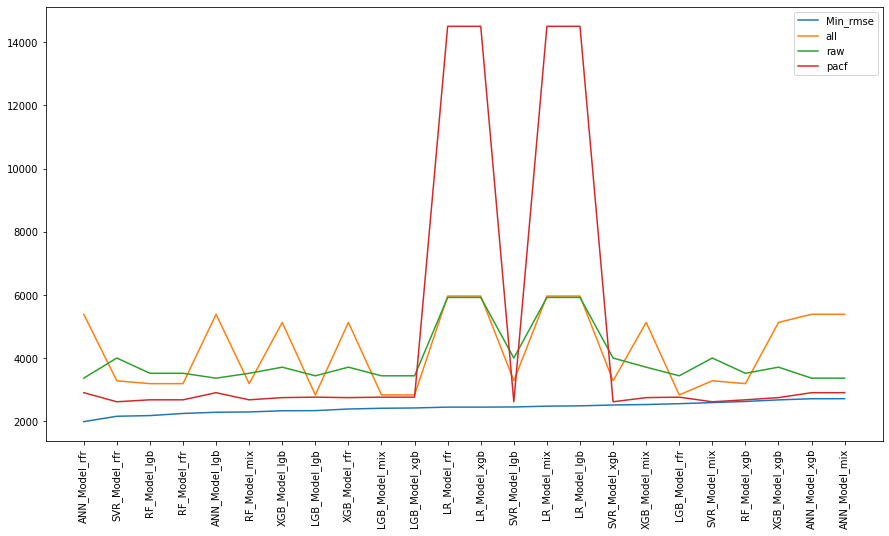

In [140]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/Energy/Compare.png")
plt.show()

### 画图

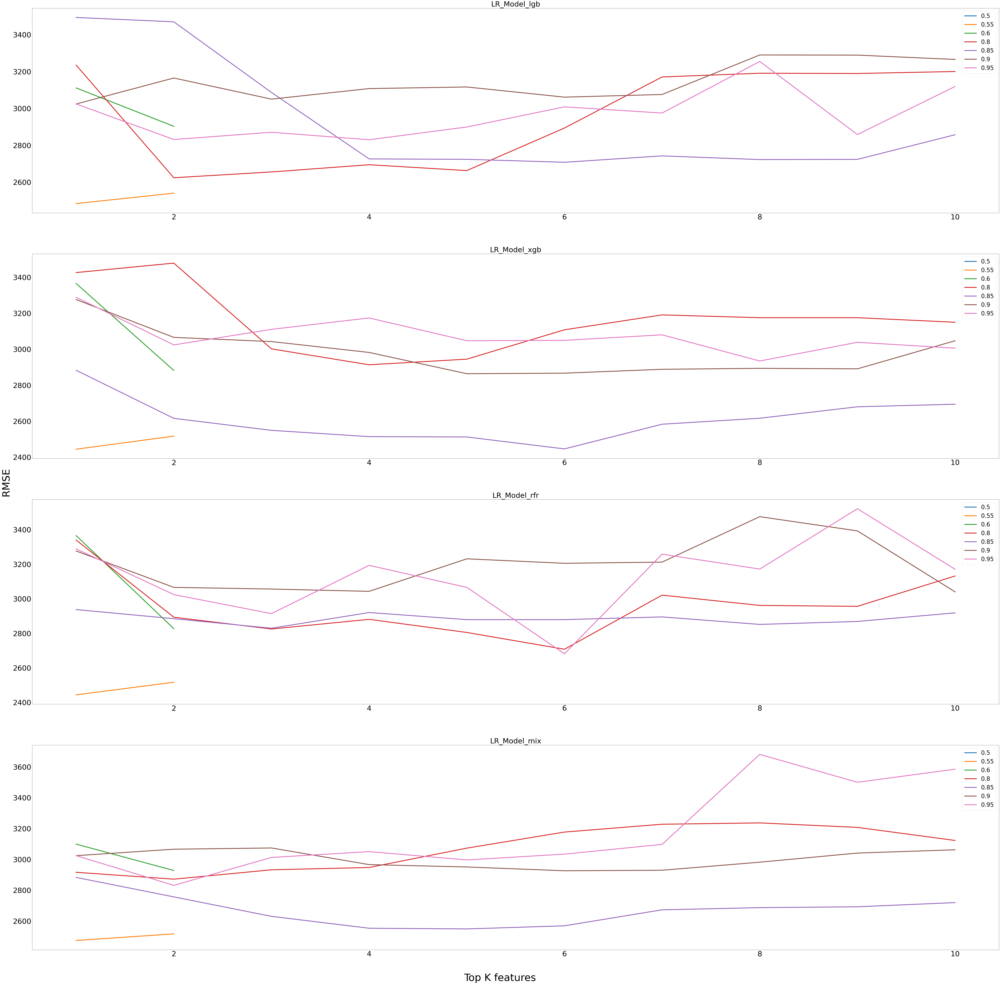

In [146]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/Linear.png')

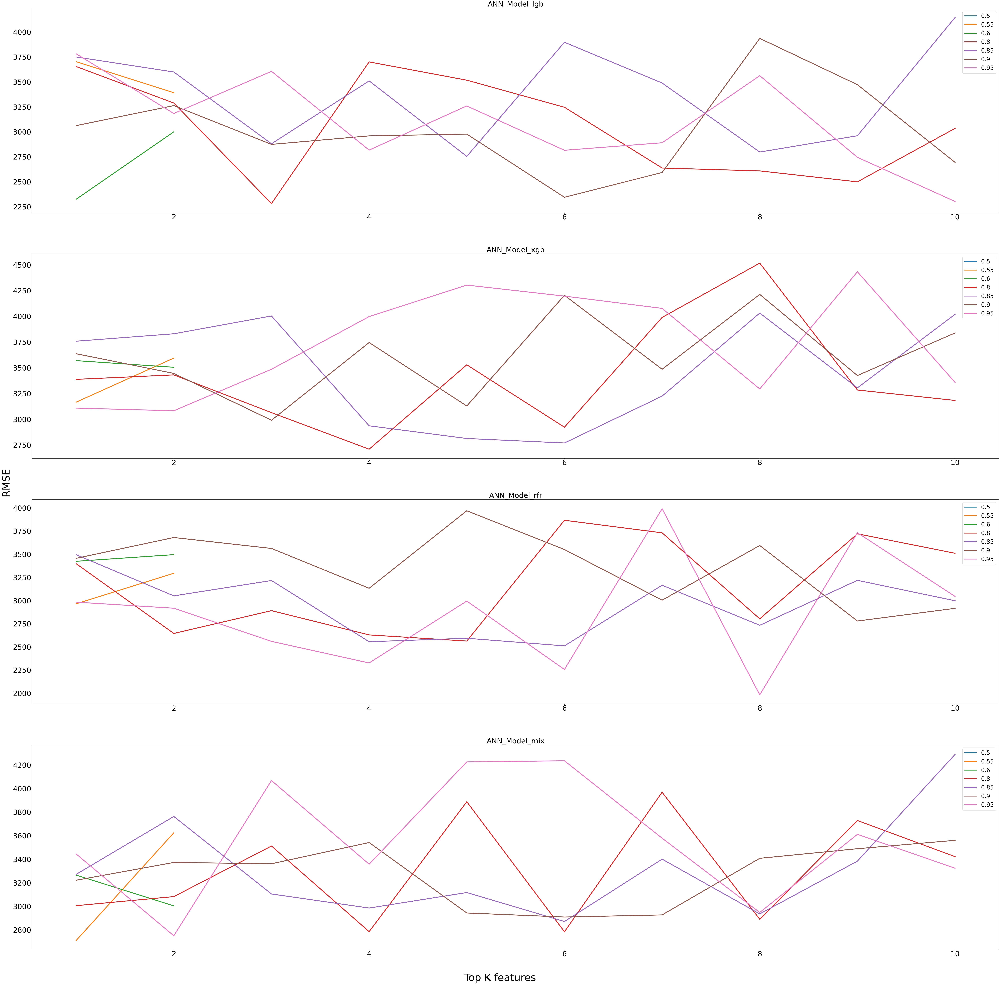

In [147]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/ANN.png')

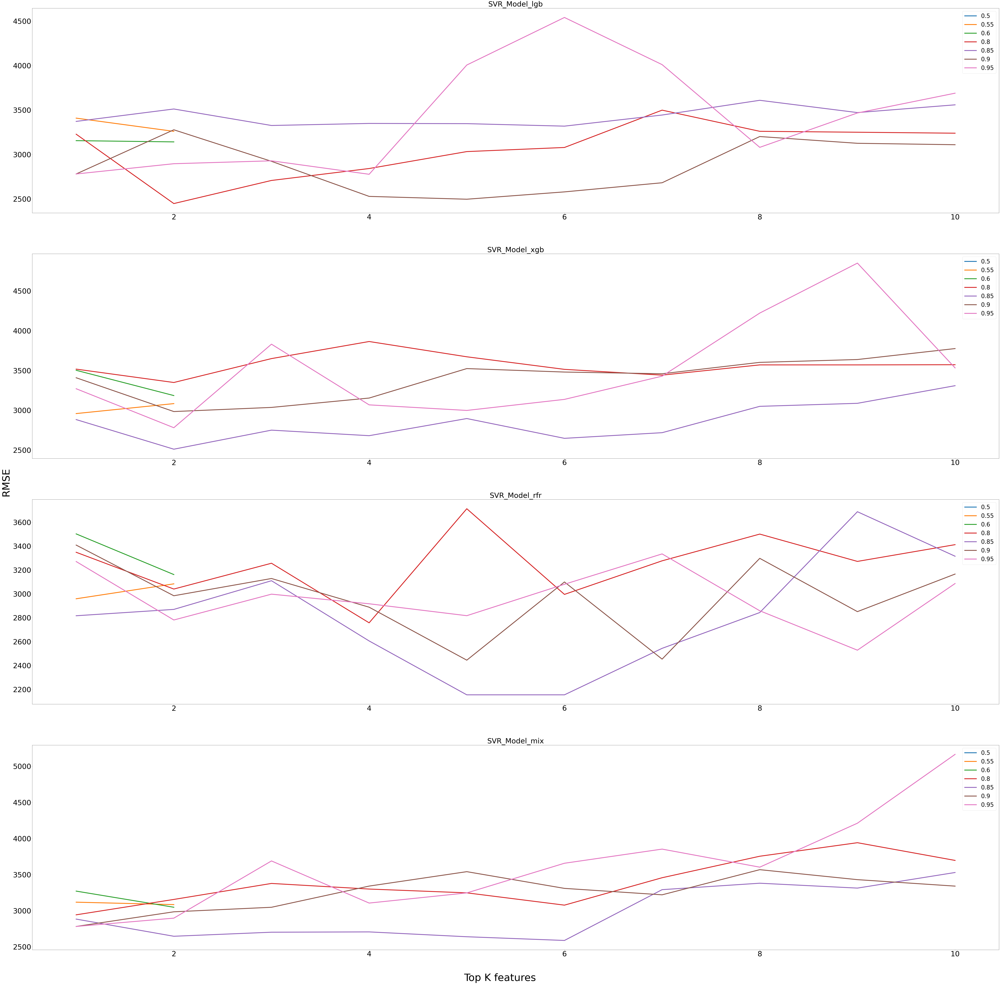

In [148]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/SVR.png')

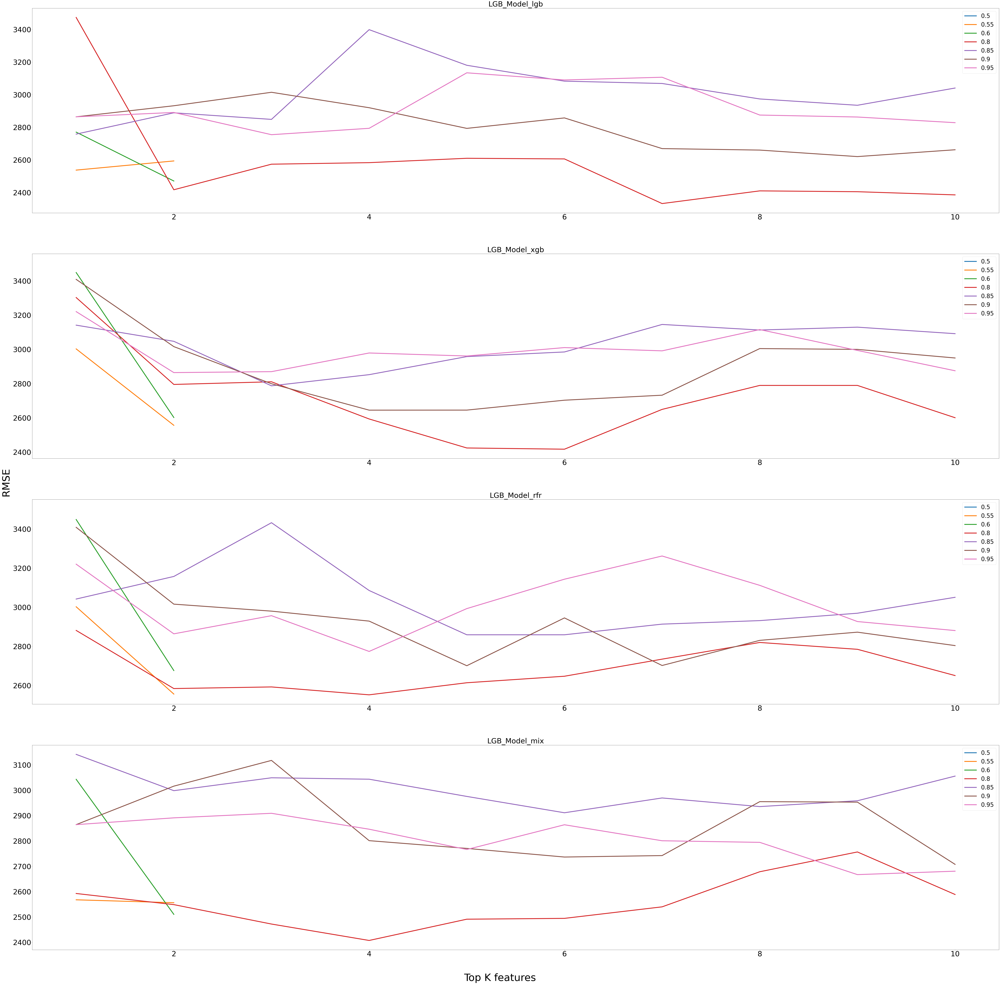

In [149]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/LGB.png')

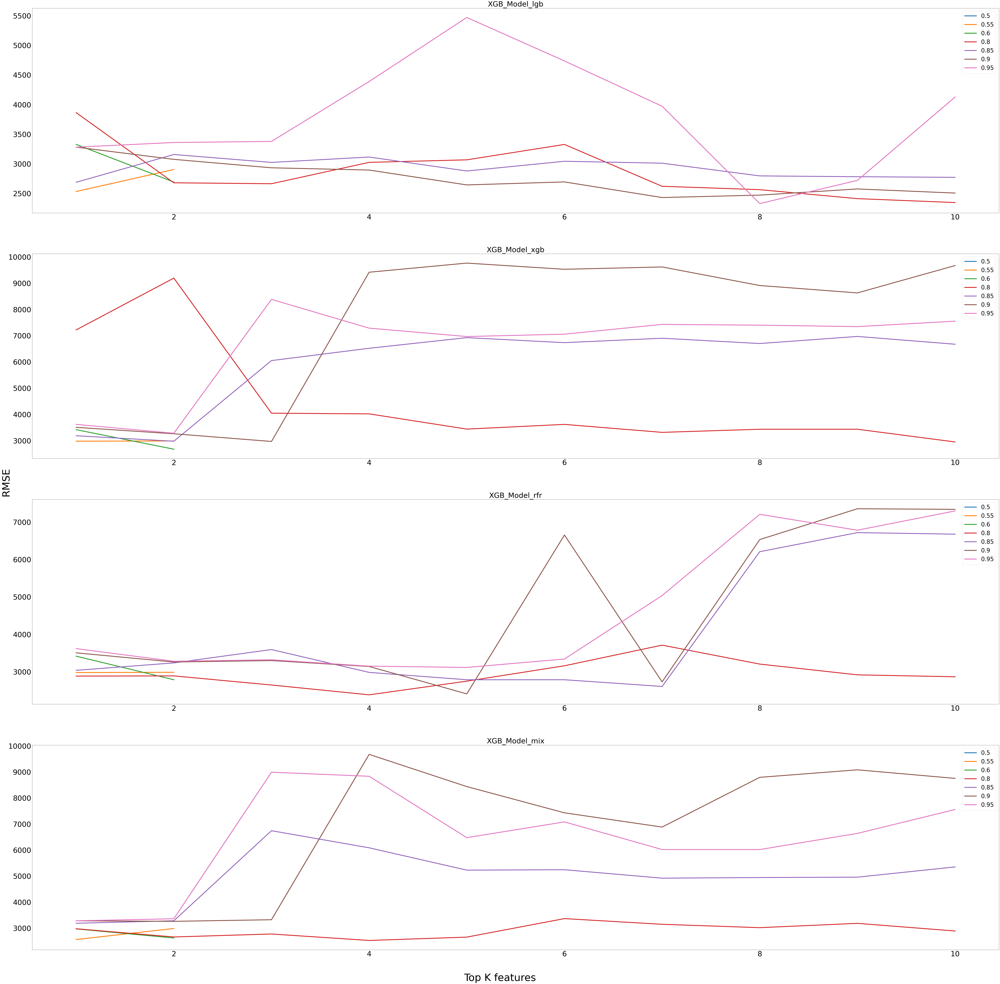

In [150]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/XGB.png')

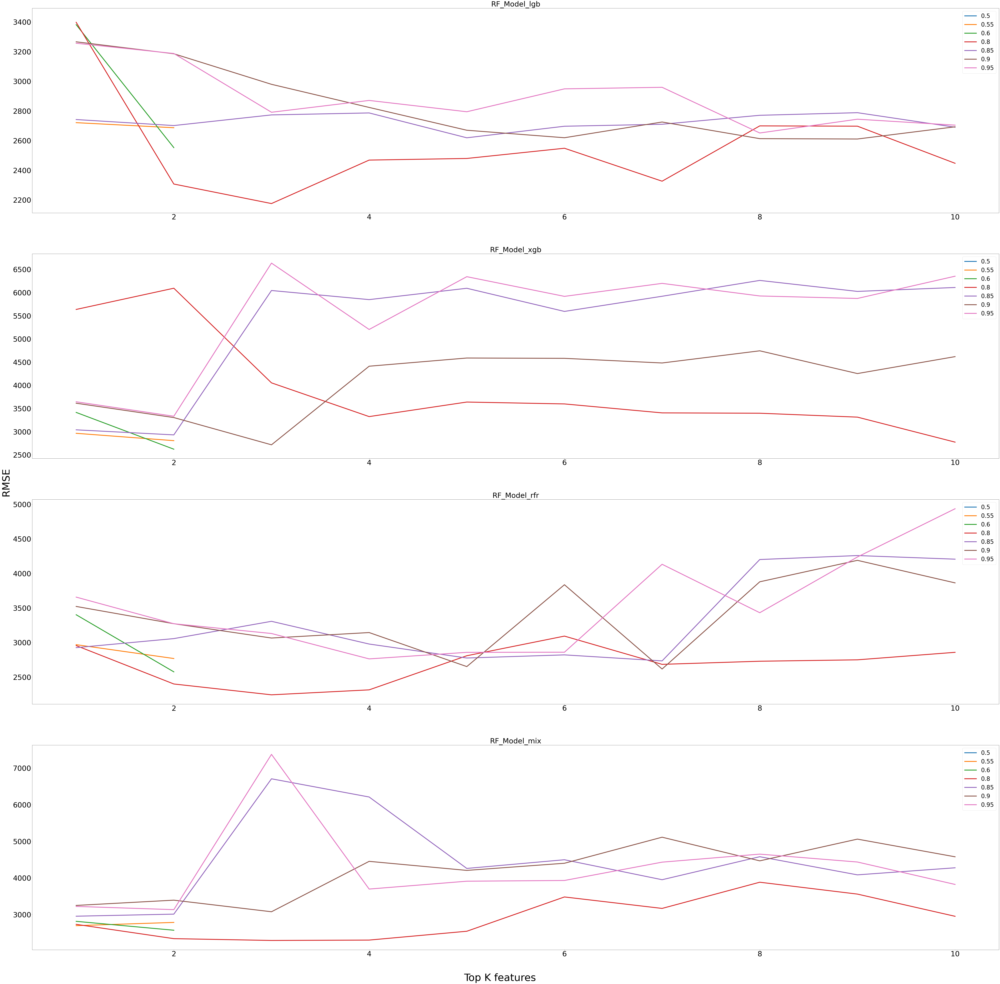

In [151]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Energy/RF.png')

In [144]:
def ANN_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    y_df = pd.DataFrame({
        'Actual':y_ann_model_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_ann_model_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/Energy/Final_prediction.png")
    return y_df

7/7 [==============================] - 0s 5ms/step - loss: 0.1599
0.2932779593953684


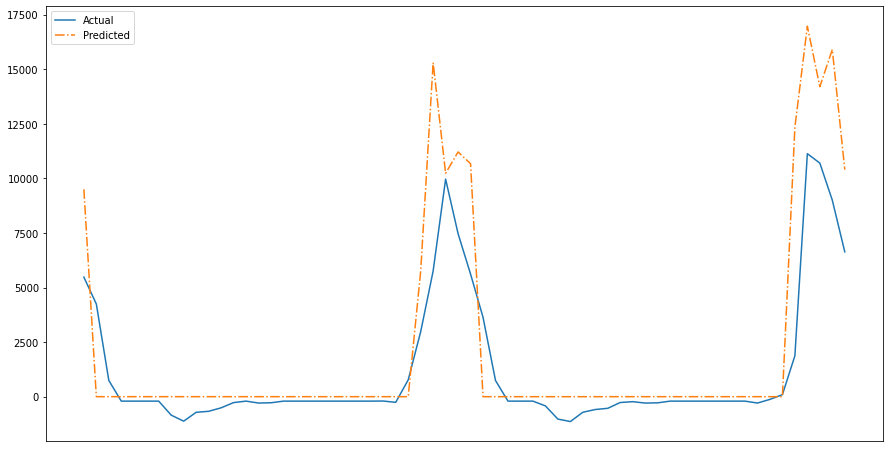

In [145]:
yy = ANN_plot(X_train_lag[real_rfr[0.95][8]],Y_train_lag,X_test_lag[real_rfr[0.95][8]],Y_test_lag)